In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from __future__ import print_function
import numpy as np
from tqdm import tqdm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
from matplotlib import cm
plt.rcParams.update({'font.size': 14, 'lines.markersize' : 4})

from scipy.optimize import curve_fit
import sys, os
import time, datetime
from datetime import timedelta
import pandas as pd
sys.path.append('/reg/d/psdm/tmo/tmox51020/results/paris/recon')
from recon_funcs import *
import h5py

/reg/neh/home/tdd14/modules/CPBASEX/pbasex-Python/pbasex/gData.py:55: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if gData['rBF'] is not 'custom':


Hi! I imported. 


In [3]:
from matplotlib import cm
from matplotlib.colors import ListedColormap
my_cmap = cm.get_cmap('jet')
xr = np.linspace(0, 1, 2000)
my_cmap = my_cmap(xr)
my_cmap[0][-1] = 0
my_cmap = ListedColormap(my_cmap)

In [4]:
# xshift, yshift =  517-510-2+2, 512-475-2
# dd2 = 2
# dd = 27-5-10


# # Coordinates that you want to Perspective Transform
# pts1 = np.float32([[0,0],\
#                    [0,1024],\
#                    [1024,0],\
#                    [1024, 1024]])


# # Size of the Transformed Image
# pts2 = np.float32([[0+xshift + dd2,0 + yshift],\
#                    [0+xshift,1024 + yshift],\
#                    [1024+xshift + dd,0 + yshift],\
#                    [1024+xshift,1024 + yshift]])

# MM = cv2.getPerspectiveTransform(pts1,pts2)


# xshift, yshift =  7+2, 33+2
# rshift = -2 #-2 #20


# # Coordinates that you want to Perspective Transform
# pts1 = np.float32([[0,0],\
#                    [0,1024],\
#                    [1024,0],\
#                    [1024, 1024]])


# # Size of the Transformed Image
# pts2 = np.float32([[0+xshift+rshift-37,0 + yshift+rshift-12],\
#                    [0+xshift+rshift-24,1024 + yshift-rshift+22],\
#                    [1024+xshift-rshift+15,0 + yshift+rshift+11],\
#                    [1024+xshift-rshift-10,1024 + yshift-rshift-41.5]])

# MM = cv2.getPerspectiveTransform(pts1,pts2)

# #make quads for 1024x1024
# quads=np.ones((1024,1024))
# quads[:512,:512]=0.925
# quads[:512,512:]=0.9375
# quads[512:,:512]=0.98
# quads[512:,512:]=1
# quads = cv2.warpPerspective(quads,MM,(1024,1024))


# quads2=np.ones((1024,1024))
# quads2[:512,:512]=.97275
# quads2[:512,512:]=.97775
# quads2[512:,:512]=0.988
# quads2[512:,512:]=1
# quads2 = cv2.warpPerspective(quads2,MM,(1024,1024))


# def make_MM(x0):
#     xshift, yshift =  7+2, 33+2
#     rshift = -2 #-2 #20


#     # Coordinates that you want to Perspective Transform
#     pts1 = np.float32([[0,0],\
#                        [0,1024],\
#                        [1024,0],\
#                        [1024, 1024]])


#     # Size of the Transformed Image
#     pts2 = np.float32([[0+xshift+rshift-37-x0[0],0 + yshift+rshift-12-x0[1]],\
#                        [0+xshift+rshift-24-x0[2],1024 + yshift-rshift+22-x0[3]],\
#                        [1024+xshift-rshift+15-x0[4],0 + yshift+rshift+11-x0[5]],\
#                        [1024+xshift-rshift-10-x0[6],1024 + yshift-rshift-41.5-x0[7]]])

#     MM = cv2.getPerspectiveTransform(pts1,pts2)
#     return MM

# MM = make_MM([1.75776697,   3.09381592,   4.10098196,  -7.83897223,   3.70084582, 1.76187301, -10.28155775,  -9.08911189])
def make_MM(x0):
    xshift, yshift =  x0[8], x0[9] 

    # Coordinates that you want to Perspective Transform
    pts1 = np.float32([[0,0],\
                       [0,1024],\
                       [1024,0],\
                       [1024, 1024]])


    # Size of the Transformed Image
    pts2 = np.float32([[0+xshift-x0[0],0 + yshift-x0[1]],\
                       [0+xshift-x0[2],1024 + yshift-x0[3]],\
                       [1024+xshift-x0[4],0 + yshift-x0[5]],\
                       [1024+xshift-x0[6],1024 + yshift-x0[7]]])

    MM = cv2.getPerspectiveTransform(pts1,pts2)
    return MM

X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhm=np.zeros((1024,1024))
maskhm[(rs>120) & (rs<420)]=1
nmask = np.reshape(rebin(rebin(maskhm,4),4),[64**2,])


x,y, = 530,512
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-x)**2+(Y-y)**2)
mask=np.zeros((1024,1024))
mask[rs>1*48]=1

nmask = np.reshape(rebin(rebin(maskhm,4),4),[64**2,]) #rebin later
nnmask = (rebin(np.reshape(nmask, [64,64]))).flatten()
nnmask = rebin(rebin(maskhm,4),4)
#nnmask = (rebin(np.reshape(nmask, [64,64])*(inbg))).flatten()
nnmask[nnmask<0.5] = 0
nnmask[nnmask>=0.5] = 1

maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale [(rs>120) & (rs<270)]=1

In [5]:
def make_quads(x0):
    quads=np.ones((1024,1024))
    quads[:512,:512]= x0[0]
    quads[:512,512:]= x0[1]
    quads[512:,:512]= x0[2]
    quads[512:,512:]= x0[3]
    return quads


In [6]:
PR = PolarRebin('/reg/d/psdm/tmo/tmox51020/results/paris/recon/PR_c32_r32_th32.h5') 

gasoff = np.load('/reg/d/psdm/tmo/tmox51020/results/paris/recon/gas_off_X510_112.npy')
inner_bg = np.load('/reg/d/psdm/tmo/tmox51020/results/paris/recon/inner_bg2.npy')
gasoff = np.load('/reg/d/psdm/tmo/tmox51020/results/paris/recon/gas_off_X510_112.npy')
inner_bg = np.load('/reg/d/psdm/tmo/tmox51020/results/paris/recon/inner_bg2.npy')

resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/resid_bg_run110_2.npy') #np.load('/cds/home/p/paris/reconVMI_clean/resid_bg_mfgf10_unsat5.npy')
residold = np.load('/cds/home/p/paris/reconVMI_clean/resid_bg_mfgf10.npy')
#for background cal
ims_bg = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Aug/bg_for_cal.npy')
thresh = 32
mfn = 20 #int(sys.argv[5]) #applied to the measured image for preprocessing
gfn = 10 #float(sys.argv[6])
gfsig = 0.985 #0.985 #0.875
 #int(sys.argv[7])
gfcart = 0.25 #applied to the simulated image to try to make it match the measured
mfcart = 1

In [6]:
tt = [4410467754356193385,4410467118580787210,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
      4410467689813058340, 4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012,
      4410466482935666616, 4410466573846689349, 4410466594694478956, 4410466654584819656, 4410466684855376363, 4410466684972030485,4410466732255078812, 4410466753627943040, 4410466771014121067,
      4410466861457740912, 4410466865519007108, 4410466869746996948, 4410466925753018715, 4410466930289290010, 4410466981025037018]
print(len(tt))
print(len(np.unique(tt)))

32
32


In [7]:
## Run 112
runnum = 112
thresh = 32

MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_112_Mar.npy')
quads = cv2.warpPerspective(make_quads([0.97,0.967,0.99,0.999]),MM,(1024,1024))

resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_112_Jul27.npy')
quads = cv2.warpPerspective(make_quads([0.92, 0.92837547, 0.93816438, 0.96240218]),MM,(1024,1024))

#gasoff0 = np.load('/reg/d/psdm/tmo/tmox51020/results/paris/recon/X510_Run112_prebin_nostretch.npy')
# resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_112_2.npy')
# MM = make_MM([ -9.54346309,  -2.83400071,   7.03704724,  -4.72205756,   3.24594164, 2.42572902, -10.96778242,  -8.0874046 ])
# quads = cv2.warpPerspective(make_quads([0.9349,0.9431,0.9565,0.9739]),MM,(1024,1024)) #cv2.warpPerspective(make_quads([0.9026,0.90,0.9155,0.998]),MM,(1024,1024))
maskscale2 = np.zeros((1024,1024)) ###before stretching
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-840)**2+(Y-590)**2)
maskscale2 [(rs<40)]=1
mfn = 25 
gfn = 15 
tt = np.array([4410466482935666616, 4410466483277240371, 4410466483602167976,
       4410466487221983517, 4410466487288568117, 4410466487363541328,
       4410466487455291761, 4410466487555168661, 4410466487563557272,
       4410466487796865516, 4410466488038431299, 4410466496044571713,
       4410466496277748885, 4410466496344464557, 4410466500189199731,
       4410466500547419636, 4410466509161603277, 4410466509494919493,
       4410466521962095847, 4410466522078749969, 4410466525815219632,
       4410466526464943770, 4410466526673217253, 4410466534479341723,
       4410466534670969056, 4410466547862973831, 4410466551532727822,
       4410466551741001305, 4410466551857655427, 4410466552082575060,
       4410466573846689349, 4410466594452913173, 4410466594694478956,
       4410466594902752439, 4410466598747487613, 4410466599730396895,
       4410466603933220902, 4410466607877964048, 4410466612513981171,
       4410466616008885051, 4410466616092115801, 4410466616225416073,
       4410466616733582400, 4410466616900174972, 4410466620736521535,
       4410466620753167685, 4410466625222723308, 4410466625389315880,
       4410466628825892699, 4410466629317412876, 4410466633770191277,
       4410466634070084121, 4410466637939722984, 4410466638006438656,
       4410466641834527680, 4410466651198312359, 4410466654584819656,
       4410466668401644880, 4410466671771506027, 4410466671804929399,
       4410466671896548760, 4410466672254768665, 4410466680352528440,
       4410466680819013856, 4410466684855376363, 4410466684972030485,
       4410466685513489112, 4410466689674894352, 4410466693294840965,
       4410466706362196223, 4410466715076649980, 4410466715318215763,
       4410466715459904646, 4410466715501454485, 4410466719921071658,
       4410466727627319228, 4410466728127096944, 4410466732255078812,
       4410466732713306689, 4410466741127474386, 4410466744847297899,
       4410466745005501860, 4410466745388756526, 4410466745605287548,
       4410466749133483728, 4410466749616615294, 4410466750007996427,
       4410466753386377257, 4410466753502900307, 4410466753519546457,
       4410466753627943040, 4410466758313898613, 4410466761967006454,
       4410466762749899792, 4410466766536307905, 4410466766694642938,
       4410466771014121067, 4410466784180828937, 4410466800900636708,
       4410466814050829500, 4410466860782982013, 4410466860891247524,
       4410466860991124424, 4410466861457740912, 4410466865519007108,
       4410466869746996948, 4410466870080182092, 4410466925753018715,
       4410466930289290010, 4410466981025037018, 4410467011094660277,
       4410467020358436984, 4410467041731039068, 4410467042022543301,
       4410467066956109577, 4410467093272092735, 4410467093405393007,
       4410467105780687856, 4410467106022122567, 4410467110141715824,
       4410467118580787210, 4410467118880680054, 4410467123391785516,
       4410467136200535625, 4410467144531472572, 4410467148692746740,
       4410467149450867461, 4410467157315318992, 4410467175126563668,
       4410467183348972960, 4410467187576962800, 4410467191937990768,
       4410467192021352590, 4410467200601981787, 4410467209016018412,
       4410467209574123189, 4410467213010700008, 4410467217463347337,
       4410467226635242539, 4410467239018794927, 4410467256255026532,
       4410467264735909901, 4410467273316539098, 4410467281855618456,
       4410467286316654396, 4410467286524796807, 4410467286616416168,
       4410467295147106915, 4410467311800461126, 4410467312416892964,
       4410467324617468774, 4410467337859543071, 4410467342037463389,
       4410467342112436600, 4410467354904540559, 4410467363985340688,
       4410467397842682780, 4410467428163571153, 4410467428171828692,
       4410467428513402447, 4410467436452958261, 4410467436502896711,
       4410467453881734703, 4410467453940061764, 4410467458601244720,
       4410467462862657932, 4410467488239378799, 4410467501615146584,
       4410467505126827686, 4410467509338302448, 4410467513666300260,
       4410467513749662082, 4410467513757919621, 4410467513891219893,
       4410467514007874015, 4410467518544276382, 4410467522414046317,
       4410467530828476158, 4410467539609514515, 4410467543854150505,
       4410467561507322292, 4410467587466396265, 4410467591877624827,
       4410467604569851886, 4410467613009185416, 4410467625459846692,
       4410467625509785142, 4410467630129418259, 4410467638543717028,
       4410467660217129460, 4410467664245103356, 4410467668872994012,
       4410467672859418069, 4410467677603962847, 4410467689813058340,
       4410467694240933052, 4410467694582375735, 4410467698993604297,
       4410467702663358288, 4410467702696781660, 4410467737419461408,
       4410467742038832381, 4410467754356193385, 4410467758759033336], dtype =np.uint64)
# tt = np.array([4410466482935666616, 4410466573846689349, 4410466594694478956,
#        4410466654584819656, 4410466684855376363, 4410466684972030485,
#        4410466715076649980, 4410466715501454485, 4410466732255078812,
#        4410466753627943040, 4410466761967006454, 4410466771014121067,
#        4410466814050829500, 4410466860891247524, 4410466861457740912,
#        4410466865519007108, 4410466869746996948, 4410466925753018715,
#        4410466930289290010, 4410466981025037018, 4410467093272092735,
#        4410467093405393007, 4410467118580787210, 4410467118880680054,
#        4410467123391785516, 4410467136200535625, 4410467149450867461,
#        4410467157315318992, 4410467192021352590, 4410467200601981787,
#        4410467209016018412, 4410467226635242539, 4410467239018794927,
#        4410467273316539098, 4410467286524796807, 4410467311800461126,
#        4410467312416892964, 4410467337859543071, 4410467354904540559,
#        4410467363985340688, 4410467428513402447, 4410467436502896711,
#        4410467514007874015, 4410467518544276382, 4410467530828476158,
#        4410467604569851886, 4410467668872994012, 4410467677603962847,
#        4410467689813058340, 4410467694240933052, 4410467694582375735,
#        4410467754356193385], dtype =np.uint64)

print(len(tt))
print(len(np.unique(tt)))

204
204


In [25]:
tt[195]

4410467694240933052

In [19]:
## Run 121
runnum = 121
thresh = 32
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
quads = cv2.warpPerspective(make_quads([0.9026274050743817, 0.9353278845403191, 0.9429386493966182, 0.9696706189015828]),MM,(1024,1024))
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_121_Mar.npy')

maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale[(rs>140) & (rs<220) & (X>28*16) &(X<36*16)]=1

mfn = 25 
gfn = 15 
tt = np.array([4410489315282177714, 4410489324056400324, 4410489350062135944,
       4410489362131115418, 4410489362139504029, 4410489366368018157,
       4410489366376406768, 4410489405990563057, 4410489422587031999,
       4410489423087071859, 4410489426531906217, 4410489439566755607,
       4410489439616825129, 4410489452868205541, 4410489453209910368,
       4410489474576220993, 4410489491247794218, 4410489495826270712,
       4410489503974624297, 4410489513023049630, 4410489513039695780,
       4410489517634818424, 4410489534123021855, 4410489534714812148,
       4410489542588045506, 4410489585555810008, 4410489585564067547,
       4410489585897514835, 4410489586022557568, 4410489586197538751,
       4410489589850908736, 4410489594212592064, 4410489607589408425,
       4410489607597797036, 4410489616454463964, 4410489619916206616,
       4410489620224488071, 4410489632709490223, 4410489633101133500,
       4410489633109522111, 4410489633117910722, 4410489633234564844,
       4410489633401157416, 4410489633409546027, 4410489633426192177,
       4410489650106416157, 4410489650256362579, 4410489650273008729,
       4410489659188264862, 4410489659321565134, 4410489663091720313,
       4410489667195060636, 4410489667220095397, 4410489667228484008,
       4410489667303457219, 4410489667361784280, 4410489667453403641,
       4410489671932003235, 4410489676068766930, 4410489676577195401,
       4410489684208994048, 4410489684675741608, 4410489684850722791,
       4410489689379260835, 4410489689396038057, 4410489692974303759,
       4410489693182708314, 4410489693191096925, 4410489693299362436,
       4410489697227852648, 4410489697327860620, 4410489697419479981,
       4410489697427868592, 4410489697586203625, 4410489697869581391,
       4410489702314757613, 4410489705901411926, 4410489705918189148,
       4410489706068135570, 4410489710238322637, 4410489710246711248,
       4410489710696681586, 4410489710755008647, 4410489714875126192,
       4410489719253586742, 4410489719495283597, 4410489719536964508,
       4410489722965283788, 4410489723123618821, 4410489723248661554,
       4410489727560537504, 4410489728027153992, 4410489736350750904,
       4410489736359008443, 4410489736584059148, 4410489740337437105,
       4410489740345825716, 4410489749227658477, 4410489749427674421,
       4410489752989425045, 4410489757542866778, 4410489766258106967,
       4410489783455016957], dtype =np.uint64)


# tt = np.array([4410489315282177714, 4410489324056400324, 4410489350062135944,
#        4410489362131115418, 4410489362139504029, 4410489366368018157,
#        4410489366376406768, 4410489405990563057, 4410489422587031999,
#        4410489423087071859, 4410489426531906217, 4410489439566755607,
#        4410489439616825129, 4410489452868205541, 4410489453209910368], dtype =np.uint64)
# #tt = np.array([4410489315282177714], dtype =np.uint64)

print(len(tt))
print(len(np.unique(tt)))

103
103


In [20]:
tt[8]

4410489422587031999

In [7]:
## Run 123
runnum = 123
thresh = 32
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
quads = cv2.warpPerspective(make_quads([0.92,0.95569523, 0.96540272, 0.99122144]),MM,(1024,1024))
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_123_Mar.npy')

X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale[(rs>130) & (rs<220)]=1
maskscale[(Y>26*16) & (Y<38*16)]=0

fanmask = np.ones((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
fanmask [(16*46.5<X) &(X<16*58) & (32*16<Y) & (Y<42*16)]=0


mfn = 25 
gfn = 15 
tt = np.array([4410492021587985781, 4410492021613020542, 4410492021621278081,
       4410492021638055303, 4410492038518295227, 4410492038534941377,
       4410492038543329988, 4410492038710053632, 4410492038718311171,
       4410492038726699782, 4410492038734957321, 4410492038751734543,
       4410492042813393955, 4410492042830171177, 4410492042846817327,
       4410492059427295479, 4410492059435684090, 4410492059443941629,
       4410492059452330240, 4410492059460587779, 4410492059685638484,
       4410492059735708006, 4410492063914152612, 4410492063922541223,
       4410492063930798762, 4410492063972479673, 4410492085589924340,
       4410492085639993862, 4410492085648251401, 4410492094113537196,
       4410492094130183346, 4410492094138571957, 4410492094146960568,
       4410492094421949723, 4410492094438595873, 4410492094455242023,
       4410492094463630634, 4410492094596930906, 4410492094605319517,
       4410492094613708128, 4410492094621965667, 4410492094630354278,
       4410492094638611817, 4410492098317016563, 4410492098325405174,
       4410492098342051324, 4410492098367086085, 4410492098533678657,
       4410492098542067268, 4410492098558713418, 4410492098567102029,
       4410492098683756151, 4410492098692013690, 4410492098733694601,
       4410492102428745497, 4410492102437134108, 4410492102445391647,
       4410492107515650462, 4410492107548942762, 4410492110852350381,
       4410492115539092386, 4410492115547480997, 4410492115589161908,
       4410492115597419447, 4410492132827621737, 4410492132844267887,
       4410492132852656498, 4410492132944275859, 4410492132969310620,
       4410492132977568159, 4410492132985956770, 4410492141401041971,
       4410492141425945660, 4410492141442591810, 4410492153885913051,
       4410492153894301662, 4410492179630553154, 4410492210302583541,
       4410492240083586151, 4410492244161891713, 4410492257171706342,
       4410492266161411398, 4410492286977612641, 4410492287010904941,
       4410492287402548218, 4410492330193365457, 4410492330201754068,
       4410492335096638484, 4410492338566507603, 4410492338824850608,
       4410492347164700454, 4410492347172957993, 4410492347447947148,
       4410492408008983512, 4410492411728807025, 4410492442017320602,
       4410492489753353923, 4410492524038908392, 4410492527892294321,
       4410492528359041881, 4410492549701366321, 4410492600901108374,
       4410492677818096473, 4410492695039254792, 4410492695047512331,
       4410492699592434381, 4410492793778684241, 4410492815711488254,
       4410492815736523015, 4410492820239633082, 4410492832974327484,
       4410492836910944163, 4410492836919332774, 4410492837177544707,
       4410492837194321929, 4410492837227614229, 4410492841005895875,
       4410492841464123752, 4410492845625660064, 4410492845650694825,
       4410492863446866215, 4410492867425032733, 4410492889166340485,
       4410492901917812109, 4410492901942846870, 4410492905654412844,
       4410492927221394773, 4410492927371472267, 4410492936203235506,
       4410492939839959341, 4410492969971579677, 4410492970679893020,
       4410493000242660672, 4410493000275952972, 4410493000500872605,
       4410493004678661851, 4410493004878546723, 4410493038652002705,
       4410493039493354176, 4410493043404936094, 4410493111738018196,
       4410493120319171681, 4410493120485895325, 4410493120569126075,
       4410493124514000293, 4410493125022297692, 4410493141693346629,
       4410493142534829172, 4410493142543086711, 4410493146613003662,
       4410493146729657784, 4410493167637347316, 4410493202063279948,
       4410493214773070661, 4410493219901132249, 4410493223596052073,
       4410493231877443786, 4410493236955566924, 4410493237122159496,
       4410493240575513537, 4410493240600417226, 4410493240608805837,
       4410493240625451987, 4410493244911899960, 4410493244920288571,
       4410493244928677182, 4410493244936934721, 4410493244945323332,
       4410493245378516448, 4410493245386905059, 4410493245395162598,
       4410493245403551209, 4410493245411939820, 4410493245420197359,
       4410493249140151944, 4410493249731680093, 4410493249740068704,
       4410493254159816949, 4410493254193109249, 4410493254209755399,
       4410493266619260052, 4410493266644294813, 4410493266652683424], dtype =np.uint64)


print(len(tt))
print(len(np.unique(tt)))


183
183


In [72]:
runnum = 124
thresh = 32
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
quads = cv2.warpPerspective(make_quads([0.92,       0.96336491, 0.97296838, 1.        ]),MM,(1024,1024))
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_124_Mar.npy')
maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale[(rs>130) & (rs<220)]=1
maskscale[(Y>26*16) & (Y<38*16)]=0

fanmask = np.ones((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
fanmask [(16*46.5<X) &(X<16*58) & (32*16<Y) & (Y<42*16)]=0

mfn = 25 
gfn = 15 
tt = np.array([4410493867946975648, 4410493867972010409, 4410493867988656559,
       4410493867997045170, 4410493868196930042, 4410493868205318653,
       4410493868221964803, 4410493871850168955, 4410493871866946177,
       4410493871875203716, 4410493872133546721, 4410493872158581482,
       4410493872166839021, 4410493876578329727, 4410493876594975877,
       4410493876886611182, 4410493876920034554, 4410493880689927589,
       4410493880698316200, 4410493880706573739, 4410493880714962350,
       4410493881023243805, 4410493881056536105, 4410493881214871138,
       4410493881223259749, 4410493881231517288, 4410493881239905899,
       4410493885043091234, 4410493885051479845, 4410493885059737384,
       4410493885084772145, 4410493885526484944, 4410493885551388633,
       4410493885568165855, 4410493889396385951, 4410493889438066862,
       4410493889871391050, 4410493889888037200, 4410493889913071961,
       4410493893324614019, 4410493893341260169, 4410493893457914291,
       4410493893474691513, 4410493893482949052, 4410493893633026546,
       4410493893649672696, 4410493893657930235, 4410493893666318846,
       4410493893674576385, 4410493898036259713, 4410493906826210969,
       4410493906834599580, 4410493906842857119, 4410493910837931931,
       4410493910854578081, 4410493910862835620, 4410493910871224231,
       4410493910971232203, 4410493910987878353, 4410493910996266964,
       4410493911004524503, 4410493911121178625, 4410493914766159999,
       4410493915224518948, 4410493915241296170, 4410493915507896714,
       4410493915732947419, 4410493919044612577, 4410493919394574943,
       4410493919402963554, 4410493919411221093, 4410493919427867243,
       4410493919544652437, 4410493919561298587, 4410493919569556126,
       4410493919577944737, 4410493919586202276, 4410493928126330210,
       4410493928134718821, 4410493928276407704, 4410493928309831076,
       4410493928468035037, 4410493928476423648, 4410493936999905432,
       4410493937008294043, 4410493937024940193, 4410493941236677099,
       4410493941245065710, 4410493941253454321, 4410493949176888273,
       4410493949185145812, 4410493949201923034, 4410493949410196517,
       4410493949418585128, 4410493949443619889, 4410493954072034833,
       4410493954080423444, 4410493954105458205, 4410493954247147088,
       4410493954263793238, 4410493954272181849, 4410493954288827999,
       4410493958667288549, 4410493958675546088, 4410493962095607829,
       4410493962103996440, 4410493962128900129, 4410493962370596984,
       4410493962545709239, 4410493962553966778, 4410493962570612928,
       4410493962879025455, 4410493962895671605, 4410493962904060216,
       4410493966407352707, 4410493966415741318, 4410493966423998857,
       4410493966432387468, 4410493966440776079, 4410493966449033618,
       4410493966790738445, 4410493966799127056, 4410493966815773206,
       4410493967032435300, 4410493967132574344, 4410493967140831883,
       4410493967149220494, 4410493967240839855, 4410493967257486005,
       4410493970644124374, 4410493975722771800, 4410493975756195172,
       4410493979409565157, 4410493979442857457, 4410493979592934951,
       4410493979601192490, 4410493980084717272, 4410493980092974811,
       4410493980109620961, 4410493983746344796, 4410493983771379557,
       4410493988449864023, 4410493988466641245, 4410493992620051090,
       4410493992628308629, 4410493992636697240, 4410493992653343390,
       4410493996998511640, 4410493997206916195, 4410493997215173734,
       4410494001135275335, 4410494001418653101, 4410494005521993424,
       4410494005530382035, 4410494005538639574, 4410494005547028185,
       4410494005722009368, 4410494005730397979, 4410494005747044129,
       4410494009583783908, 4410494009650499580, 4410494013603762409,
       4410494040007432765, 4410494048539041016, 4410494048555687166,
       4410494048564075777, 4410494052442365395, 4410494052584054278,
       4410494052592311817, 4410494052609089039, 4410494078928873285,
       4410494095708449877, 4410494095716838488, 4410494096008473793,
       4410494104198246145, 4410494117066240819, 4410494117091144508,
       4410494117116179269, 4410494121236034670, 4410494121252680820,
       4410494126072460953, 4410494126089107103, 4410494159581282471,
       4410494159606317232, 4410494176935741062, 4410494185825569218,
       4410494185850472907, 4410494186208823884, 4410494186225470034,
       4410494193965403120, 4410494193973660659, 4410494193982049270,
       4410494220335519032, 4410494670924523609, 4410494683550428212,
       4410494692139970308, 4410494692864798729, 4410494700887847437,
       4410494709577659649, 4410494709585917188, 4410494709602563338,
       4410494748766093929], dtype =np.uint64)


print(len(tt))
print(len(np.unique(tt)))


58
58


In [196]:
tt = np.array([4410466482935666616, 4410466573846689349,4410466684972030485], dtype = np.uint64)

In [23]:
# Run 110
runnum = 110
thresh = 32
gfn = 15
mfn = 25

resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_110_Mar.npy')
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
quads = cv2.warpPerspective(make_quads([0.92,0.935,0.937,0.956]),MM,(1024,1024))
# resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_110.npy')
# MM = make_MM([ -9.54346309,  -2.83400071,   7.03704724,  -4.72205756,   3.24594164, 2.42572902, -10.96778242,  -8.0874046 ])
# quads = cv2.warpPerspective(make_quads([0.93,0.947,0.9596,0.981]),MM,(1024,1024)) 

#quads3 = make_quads([0.9592506151307258,0.9696854749097772,0.9844955407175854,0.9999999999984409])
#quads3= cv2.warpPerspective(quads3,MM,(1024,1024))   

# tt = np.array([4410464494857293057, 4410464495057177929, 4410464499418468041,
#        4410464516338947084, 4410464520158778569, 4410464525261674324,
#        4410464533284591960, 4410464537179527728, 4410464542232485033,
#        4410464567309706272, 4410464580710770962, 4410464580760709412,
#        4410464584447371697, 4410464584464017847, 4410464584680679941,
#        4410464584772299302, 4410464589150497708, 4410464593936854469,
#        4410464610766107367, 4410464615244051601, 4410464636825713600,
#        4410464645414862480, 4410464653504233644, 4410464653737541888,
#        4410464658115478150, 4410464666513130769, 4410464709293986533,
#        4410464718408341106, 4410464726456162431, 4410464726797736186,
#        4410464747679604525, 4410464751982698648, 4410464760521909078,
#        4410464777942034765, 4410464787222850838, 4410464795437264735,
#        4410464804418187964, 4410464885622410468, 4410464893812444964,
#        4410464928413883067, 4410464945235271642, 4410465005528003526], dtype = np.uint64)

tt = np.array([4410464495165574512, 4410464498527178120, 4410464498552081809,
       4410464498602151331, 4410464498660478392, 4410464498727062992,
       4410464498851974653, 4410464499160256108, 4410464499185290869,
       4410464502888468232, 4410464502913371921, 4410464503396634559,
       4410464503646457881, 4410464507324731555, 4410464507474677977,
       4410464508082721204, 4410464511819321939, 4410464512085922483,
       4410464512335876877, 4410464515805745996, 4410464516063957929,
       4410464516647228539, 4410464520008832147, 4410464520033735836,
       4410464520233751780, 4410464520392086813, 4410464520708625807,
       4410464520766952868, 4410464524528457292, 4410464524620207725,
       4410464528748320665, 4410464528923301848, 4410464532876433605,
       4410464532951406816, 4410464533009733877, 4410464533284591960,
       4410464533517900204, 4410464533626296787, 4410464537387801211,
       4410464537421093511, 4410464537471163033, 4410464537671047905,
       4410464537737763577, 4410464537746021116, 4410464537771055877,
       4410464537804348177, 4410464537820994327, 4410464537937648449,
       4410464538021010271, 4410464538062691182, 4410464538129275782,
       4410464541740833784, 4410464542032469089, 4410464542174157972,
       4410464542232485033, 4410464545769069824, 4410464545827396885,
       4410464545869077796, 4410464545877335335, 4410464546277236151,
       4410464546402278884, 4410464546493898245, 4410464550222110369,
       4410464550488710913, 4410464551038689223, 4410464554391904220,
       4410464563048161988, 4410464563114877660, 4410464563156427499,
       4410464563314762532, 4410464563323151143, 4410464563839706081,
       4410464567634633877, 4410464567809615060, 4410464571829462489,
       4410464576424191917, 4410464580219119713, 4410464580252412013,
       4410464580727417112, 4410464584513956297, 4410464584813980213,
       4410464588742208281, 4410464588808792881, 4410464589442133013,
       4410464593378618620, 4410464597873471148, 4410464598165106453,
       4410464598248337203, 4410464598273371964, 4410464605888131245,
       4410464606063112428, 4410464606096404728, 4410464606463013244,
       4410464610382852701, 4410464610524541584, 4410464611057742672,
       4410464614652654524, 4410464615277474973, 4410464618814059764,
       4410464619272156569, 4410464619447137752, 4410464619713738296,
       4410464623475242720, 4410464624000055197, 4410464627469924316,
       4410464627519993838, 4410464627603224588, 4410464628028160165,
       4410464628069841076, 4410464628094744765, 4410464628111390915,
       4410464632072911283, 4410464632106203583, 4410464632281184766,
       4410464636025911968, 4410464636059335340, 4410464636092627640,
       4410464636725705628, 4410464640353909780, 4410464644615191920,
       4410464644648484220, 4410464645464800930, 4410464649634463709,
       4410464653504233644, 4410464658198839972, 4410464662010282846,
       4410464662051963757, 4410464662085256057, 4410464662226813868,
       4410464662518449173, 4410464662618457145, 4410464666513130769,
       4410464670641243709, 4410464671074436825, 4410464671149410036,
       4410464671249418008, 4410464674669348677, 4410464675452504159,
       4410464679597263249, 4410464683367156284, 4410464683500456556,
       4410464683792091861, 4410464683858676461, 4410464683891968761,
       4410464684175346527, 4410464687561853824, 4410464687595277196,
       4410464687853489129, 4410464687936850951, 4410464688095185984,
       4410464688103443523, 4410464691789974736, 4410464700779417648,
       4410464704707645716, 4410464704940953960, 4410464704999281021,
       4410464705065865621, 4410464705140838832, 4410464705349112315,
       4410464705407439376, 4410464705465766437, 4410464705574031948,
       4410464709227270861, 4410464709368959744, 4410464709527294777,
       4410464709893772221, 4410464709935453132, 4410464713688700017,
       4410464713772061839, 4410464713971946711, 4410464717883397557,
       4410464717983405529, 4410464718316721745, 4410464718333367895], dtype = np.uint64)

In [255]:
tt = np.array([4410464494857293057, 4410464495057177929, 4410464499418468041,4410464516338947084, 4410464520158778569, 4410464525261674324], dtype = np.uint64)

In [12]:
#Run 116
runnum = 116
thresh = 0
gfn = 15
mfn = 25
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_116.npy')
MM = make_MM([ -9.54346309,  -2.83400071,   7.03704724,  -4.72205756,   3.24594164, 2.42572902, -10.96778242,  -8.0874046 ])
quads = cv2.warpPerspective(make_quads([0.928,0.948,0.958,0.98]),MM,(1024,1024)) 


tt = np.array([4410484157328406088, 4410484161023456984, 4410484161031845595,
       4410484161048491745, 4410484161306834750, 4410484161806874610,
       4410484161831909371, 4410484165276874801, 4410484165318555712,
       4410484165351979084, 4410484165643614389, 4410484165660260539,
       4410484165752010972, 4410484165810338033, 4410484166060423499,
       4410484169530423690, 4410484169888774667, 4410484170105436761,
       4410484170238868105, 4410484170455530199, 4410484174008892212,
       4410484174083865423, 4410484174100511573, 4410484174208908156,
       4410484174233811845, 4410484174417181639, 4410484174508932072,
       4410484174742240316, 4410484178203851896, 4410484178228886657,
       4410484178403867840, 4410484178528910573, 4410484178587237634,
       4410484178628918545, 4410484178637307156, 4410484178720668978,
       4410484178803899728, 4410484178853969250, 4410484178904038772,
       4410484179028950433, 4410484182498950624, 4410484182507339235,
       4410484182523985385, 4410484182657285657, 4410484182673931807,
       4410484182698966568, 4410484182732258868, 4410484182790585929,
       4410484183098998456, 4410484183132290756, 4410484183149067978,
       4410484183165714128, 4410484183299014400, 4410484186652360469,
       4410484186669006619, 4410484186910703474, 4410484187094073268,
       4410484187277311990, 4410484187419000873, 4410484187427389484,
       4410484190947328125, 4410484191522341196, 4410484191855657412,
       4410484196042359557, 4410484196225729351, 4410484199587332959,
       4410484199712244620, 4410484199720633231, 4410484200070595597,
       4410484200128922658, 4410484200178992180, 4410484204748817919], dtype = np.uint64)



In [8]:
tt = np.array([4410484200128922658, 4410484200178992180, 4410484204748817919], dtype = np.uint64)

In [8]:
#run 117
runnum = 117
thresh = 32
gfn = 15
mfn = 25
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_117.npy')
MM = make_MM([ -9.54346309,  -2.83400071,   7.03704724,  -4.72205756,   3.24594164, 2.42572902, -10.96778242,  -8.0874046 ])
quads = cv2.warpPerspective(make_quads([0.939,0.954,0.962,0.982]),MM,(1024,1024)) 


tt = np.array([4410484706686986677, 4410484706828675560, 4410484707020302893,
       4410484710723611328, 4410484711515286493, 4410484711598648315,
       4410484715351895200, 4410484715385187500, 4410484719280254340,
       4410484719496916434, 4410484719663509006, 4410484719971921533,
       4410484723608514296, 4410484723808530240, 4410484724008546184,
       4410484728061816985, 4410484728270090468, 4410484728336806140,
       4410484728495141173, 4410484728736706956, 4410484732856693429,
       4410484732931666640, 4410484736618328925, 4410484736660009836,
       4410484737184953385, 4410484740688245876, 4410484740721538176,
       4410484740879873209, 4410484741213189425, 4410484741396559219,
       4410484745008117221, 4410484745099867654, 4410484745166452254,
       4410484745791403775, 4410484745866508058, 4410484745883154208,
       4410484749736409065, 4410484749744797676, 4410484749969717309,
       4410484754097961321, 4410484754131253621, 4410484754164676993,
       4410484757901277728, 4410484758376282827, 4410484758667918132,
       4410484758826253165, 4410484762321157045, 4410484762504526839,
       4410484766624513312, 4410484766816140645, 4410484766916148617,
       4410484767091129800], dtype = np.uint64)

In [9]:
#run 122
runnum = 122
thresh = 32
gfn = 15
mfn = 25
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
quads = cv2.warpPerspective(make_quads([0.9200000020207357,0.9531430716190915,0.9596694434701574,0.983830589524778]),MM,(1024,1024))
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_122_Mar.npy')

tt = np.array([4410490706548659700, 4410490702687016232, 4410490702695273771,
       4410490706990372499, 4410490707207034593, 4410490724453489817,
       4410490727956913380, 4410490728056790280, 4410490728081825041,
       4410490728548441529, 4410490737271808185, 4410490740975116620,
       4410490745795158897, 4410490745928459169, 4410490749423494121,
       4410490754360190520, 4410490758430238543, 4410490762641975449,
       4410490762658752671, 4410490762941999365, 4410490766737058233,
       4410490766770481605, 4410490780339318515, 4410490994525140084,
       4410490998878696945, 4410491003607382005, 4410491002948876040,
       4410491213509377044, 4410491273875378200, 4410491290614191385,
       4410491290622448924, 4410491290722456896, 4410491290855888240,
       4410491291489359444, 4410491294959359635, 4410491295276029701,
       4410491295284418312, 4410491307928410857, 4410491308020030218,
       4410491308595174361, 4410491308636855272, 4410491312040139791,
       4410491320855781168, 4410491321255944128, 4410491324917571652,
       4410491338536740228, 4410491393673492176], dtype = np.uint64)


In [12]:
runnum = 125
thresh = 32
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
quads = cv2.warpPerspective(make_quads([0.92,0.96219608, 0.96632877, 0.99144247]),MM,(1024,1024))
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_125_Mar.npy')
maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale[(rs>130) & (rs<220)]=1
maskscale[(Y>26*16) & (Y<38*16)]=0

fanmask = np.ones((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
fanmask [(16*46.5<X) &(X<16*58) & (32*16<Y) & (Y<42*16)]=0

mfn = 25 
gfn = 15 
tt = np.array([4410495469939633727, 4410495478687904072, 4410495478712938833,
       4410495483391292227, 4410495486727992146, 4410495607228521225,
       4410495637501306156, 4410495637551244606, 4410495654997584702,
       4410495655014230852, 4410495701823978016, 4410495706043841389,
       4410495706310441933, 4410495757465619491, 4410495762018799080,
       4410495762243849785, 4410495762477158029, 4410495762493804179,
       4410495766663729102], dtype =np.uint64)


print(len(tt))
print(len(np.unique(tt)))


19
19


In [ ]:
runnum = 126
thresh = 32
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
quads = cv2.warpPerspective(make_quads([0.92,0.96219608, 0.96632877, 0.99144247]),MM,(1024,1024))
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_126_Mar.npy')
maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale[(rs>130) & (rs<220)]=1
maskscale[(Y>26*16) & (Y<38*16)]=0

fanmask = np.ones((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
fanmask [(16*46.5<X) &(X<16*58) & (32*16<Y) & (Y<42*16)]=0

mfn = 25 
gfn = 15 
tt = np.array([4410495985896216523, 4410495989216270292, 4410495989232916442,
       4410495993902488009, 4410495993910745548, 4410496002350210150,
       4410496002366856300, 4410496002675137755, 4410496010748124913,
       4410496010756382452, 4410496015117934708, 4410496015142838397,
       4410496019912549008, 4410496027977147555, 4410496041036376346,
       4410496041044633885, 4410496045331081858, 4410496045347728008,
       4410496049434160037, 4410496053803969832, 4410496053928881493,
       4410496054428790281, 4410496054437178892, 4410496058665168732,
       4410496058798600076, 4410496062451707917, 4410496066971464134,
       4410496067346330189, 4410496070849622680, 4410496071049638624,
       4410496071057896163, 4410496071082930924, 4410496071224619807,
       4410496071241265957, 4410496071257912107, 4410496071541158801,
       4410496071549547412, 4410496071724528595, 4410496071749432284,
       4410496075127682042, 4410496075594298530, 4410496080280647319,
       4410496092306897306, 4410496092315154845, 4410496097151581128,
       4410496097184873428, 4410496113939153115, 4410496114497388964,
       4410496118908879670, 4410496122970408010, 4410496123245397165,
       4410496127540233749, 4410496140299700768, 4410496144027912892,
       4410496144044690114, 4410496144061336264, 4410496157245869932,
       4410496165518873034, 4410496165527261645, 4410496174633620823,
       4410496174650266973, 4410496178703537774, 4410496178861872807,
       4410496183448475768, 4410496191796583153, 4410496230667560935,
       4410496230692595696, 4410496255553679129, 4410496272800003281,
       4410496272808391892, 4410496272974984464, 4410496273091638586,
       4410496273108284736, 4410496281698088976, 4410496281789708337,
       4410496281798096948, 4410496285684644105, 4410496285792909616,
       4410496294432652306, 4410496294440909845, 4410496294932561094,
       4410496294940818633, 4410496295015791844, 4410496295065861366], dtype =np.uint64)


print(len(tt))
print(len(np.unique(tt)))

In [8]:
runnum = 127
thresh = 32
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])
quads = cv2.warpPerspective(make_quads([0.92,0.96219608, 0.96632877, 0.99144247]),MM,(1024,1024))
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_127_Mar.npy')
#quads = make_quads([1,1,1,1])
#resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_127_Jul.npy')
resid = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_127_Jul26.npy')
quads = cv2.warpPerspective(make_quads([0.92,0.97646352, 0.98543292, 0.99994135]),MM,(1024,1024))
maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale[(rs>130) & (rs<220)]=1
maskscale[(Y>26*16) & (Y<38*16)]=0

maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale [(rs>120) & (rs<270)]=1

fanmask = np.ones((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# fanmask [(16*46.5<X) &(X<16*58) & (32*16<Y) & (Y<42*16)]=0

mfn = 25 
gfn = 15 
# tt = np.array([4410497621974937433, 4410497621983194972, 4410497629998117213,
#        4410497652173142369, 4410497694490265229, 4410497694998562628,
#        4410497712137145557, 4410497712245542140, 4410497715882265975,
#        4410497716165512669, 4410497720519069530, 4410497729084232225,
#        4410497729576014546, 4410497737457767587, 4410497737474413737,
#        4410497738016265580, 4410497746764798069, 4410497746773186680,
#        4410497751068285408, 4410497759283616809, 4410497759292005420,
#        4410497768307400597, 4410497780459610821, 4410497793378592521,
#        4410497797940553937, 4410497806356032354, 4410497806847945747,
#        4410497827798889054, 4410497836372440360, 4410497840600954488,
#        4410497841325913981, 4410497853944478549, 4410497858481274132,
#        4410497861892816190, 4410497862042893684, 4410497862626295366,
#        4410497866279534279, 4410497866671308628, 4410497888563218162,
#        4410497917844967344, 4410497917870002105, 4410497917878390716,
#        4410497918261645382, 4410497926301864528, 4410497926593499833,
#        4410497926660215505, 4410497926685250266, 4410497926893523749,
#        4410497948019055023, 4410497948435733061, 4410497948694207138,
#        4410497952164207329, 4410497952605920128, 4410497957059353889,
#        4410498038427285378, 4410498042505853084, 4410498115919286577,
#        4410498116060975460, 4410498133309134620, 4410498162843590708,
#        4410498163410477312, 4410498167038943608, 4410498189040953661,
#        4410498214496186683, 4410498235789228033, 4410498269884859105,
#        4410498270485038009, 4410498274488632504, 4410498295690316637,
#        4410498299960773820, 4410498338812352937, 4410498343241276225,
#        4410498343816551440, 4410498377304663573, 4410498429399103419,
#        4410498437422938559, 4410498437973179013, 4410498438264945390,
#        4410498446638873968, 4410498446730493329, 4410498446863924673,
#        4410498446872313284, 4410498450392251925, 4410498450984173290,
#        4410498562621088619, 4410498584081771117, 4410498587843668757,
#        4410498601455235154, 4410498652608053413, 4410498656670106041,
#        4410498656936837657, 4410498670240122599, 4410498704187249041,
#        4410498721010865840, 4410498751463088402, 4410498777110866261,
#        4410498777285978516, 4410498777636203026, 4410498794217729754,
#        4410498794234375904, 4410498806979162853, 4410498807112594197,
#        4410498807587730368, 4410498820032362329, 4410498820199085973,
#        4410498824069380196, 4410498858949870686, 4410498862686733565,
#        4410498875481327892, 4410498875514620192, 4410498875589724475,
#        4410498880076843752, 4410498880693668806, 4410498889167736428,
#        4410498901978714761], dtype =np.uint64)


tt = np.array([4410497621974937433, 4410497621983194972, 4410497629998117213,
       4410497652173142369, 4410497712137145557, 4410497715882265975,
       4410497720519069530, 4410497729576014546, 4410497737457767587,
       4410497737474413737, 4410497738016265580, 4410497742069667453,
       4410497742469699341, 4410497746764798069, 4410497751068285408,
       4410497754463312388, 4410497759283616809, 4410497768307400597,
       4410497793378592521, 4410497797940553937, 4410497806356032354,
       4410497827798889054, 4410497836372440360, 4410497841325913981,
       4410497858481274132, 4410497861892816190, 4410497862042893684,
       4410497866279534279, 4410497866671308628, 4410497888563218162,
       4410497917844967344, 4410497917870002105, 4410497918261645382,
       4410497926301864528, 4410497926660215505, 4410497948435733061,
       4410497952164207329, 4410498042505853084, 4410498115919286577,
       4410498116060975460, 4410498133292488470, 4410498133309134620,
       4410498162843590708, 4410498163410477312, 4410498214496186683,
       4410498218549719628, 4410498235789228033], dtype =np.uint64)


print(len(tt))
print(len(np.unique(tt)))

47
47


In [9]:
# tt = [4410467754356193385,4410467118580787210,4410467689813058340,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
#       4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012] #[4410466500172553581]#[4410466517201035991] #[4410466517376017174] #[4410466521487221820] #[4410466500172553581] #[4410467694582375735] #[4410467436627939444]

# tt = [4410467754356193385,4410467118580787210,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
#       4410467689813058340, 4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012,
#       4410466482935666616, 4410466573846689349, 4410466594694478956, 4410466654584819656, 4410466684855376363, 4410466684972030485,4410466732255078812, 4410466753627943040, 4410466771014121067,
#       4410466861457740912, 4410466865519007108, 4410466869746996948, 4410466925753018715, 4410466930289290010, 4410466981025037018]

cVMIs = []
detsum = []
cVMIsold = []
specs = []
unproc = []
maxim = []
gds = []
tmstmps = []

ds=ps.DataSource(exp = 'tmox51020', run= runnum, timestamps=tt)
#ds=ps.DataSource(exp = 'tmox51020', run= runnum, filter = lambda evt:evt.timestamp in tt)

run = next(ds.runs())

opal1 = run.Detector('tmo_opal1') # OPAL camera looking at the holey mirror
gmd = run.Detector("gmd") # gas intensity detector 
timing = run.Detector('timing') # this gives access to evr codes
ebeam = run.Detector("ebeam")
opalfzp = run.Detector('tmo_fzpopal') 



if hasattr(run, 'epicsinfo'):
    epics_strs = [item[0] for item in run.epicsinfo.keys()][1:] # first one is weird
    epics_detectors = [run.Detector(item) for item in epics_strs]    

for nevent, event in enumerate(run.events()):

    # data = {'epics_'+epic_str: epic_det(event) for epic_str, epic_det in zip(epics_strs, epics_detectors)}        
    # if any(type(val) not in [int, float] for val in data.values()):
    #     print("Bad EPICS: %d" % nevent)
    #     #Nbad += 1
    #     continue

    # fetch the information from the different events
    im_look=np.copy(opal1.raw.raw(event))  #opal1im_i=np.copy(opal1.raw.image(event)) #doesn't work since update
    im1=im_look

    ims = np.rot90(im1*mask)
    detsum.append(np.sum(ims))
    #ims = cv2.warpPerspective(ims,MM,(1024,1024))
    gasoff = 0 #gasoff0#/np.mean(gasoff0)*np.mean(ims)
    ims = cv2.warpPerspective(ims-gasoff,MM,(1024,1024))*quads
    ims[ims<0] = 0
    ims2 = np.copy(ims)
    ims2 = mf(ims2, mfn)
    ims2 = gf(ims2, gfn)
    ims2= rebin(rebin(ims2,4),4)
    unproc.append(ims2)

    #resid_scale = resid/np.mean(resid[24:36,22:27])*np.mean(ims2[24:36,22:27])
    resid_scale = resid/np.mean(resid*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
    #resid_test = resid/np.mean(resid*rebin(rebin(testmask,4),4))*np.mean(ims2*rebin(rebin(testmask,4),4))
    #residold_scale = residold/np.mean(residold*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
    #ims2old = ims2 - residold_scale
    #testim = ims2 - resid_test
    maxim.append(np.max(ims2))
    ims2 = ims2 - resid_scale
    ims2 = gf(ims2,.25)
    #testim = gf(testim,.25)
    #ims2old = gf(ims2old,.25)
    #ims2 = rebin(ims2) #*inbg
    ims2 = ims2*rebin(rebin(maskhm,4),4)*250/np.max(ims2)
    #testim = testim *rebin(rebin(maskhm,4),4)*250/np.max(testim)
    #ims2old = ims2old*rebin(rebin(maskhm,4),4)*250/np.max(ims2old)
    ims2[ims2<thresh] = 0
    #testim[testim<thresh] = 0
    #ims2old[ims2old<thresh] = 0
    cVMIs.append(ims2)
    #cVMIsold.append(ims2old)
    '''
    fig,axs = plt.subplots(nrows = 1, ncols = 2, figsize = (8,4))
    axs[0].pcolormesh(ims2, cmap = my_cmap)
    axs[0].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    axs[1].pcolormesh(testim, cmap = my_cmap)
    axs[1].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.show()
    '''
    
    opalfz= np.copy(opalfzp.raw.image(event)) #np.copy(opal1.raw.image(event)) #np.copy(opal1.raw.raw(event))
    zps_data = opalfz
    zps_pixel = 100+np.argmax(np.sum(zps_data[100:900],axis=1))
    px_2d_width = 25 #spacing to cut the 2d image slice to store. Typically 50 pixel width. 25 on either side
    px_edge_width = 5 #spacing to integrate for the line out. 

    zps_2d = zps_data[zps_pixel-px_2d_width:zps_pixel+px_2d_width][:]
    zps = zps_data[zps_pixel-px_edge_width:zps_pixel+px_edge_width][:].mean(0)#
    zps_bg = zps_data[zps_pixel-px_2d_width:zps_pixel-px_2d_width+px_edge_width][:].mean(0)#
    zps = zps-zps_bg
    spec = np.squeeze(fastsmooth1(zps,10))
    spec = np.array(np.squeeze(spec) - np.mean(np.squeeze(spec)[800:900])) 
    specs.append(spec)
    gd_i=gmd.raw.energy(event)
    gds.append(gd_i)
    tmstmps.append(event.timestamp)
    print(event.timestamp) 

    

4410466482935666616
4410466483277240371
4410466483602167976
4410466487221983517
4410466487288568117
4410466487363541328
4410466487455291761
4410466487555168661
4410466487563557272
4410466487796865516
4410466488038431299
4410466496044571713
4410466496277748885
4410466496344464557
4410466500189199731
4410466500547419636
4410466509161603277
4410466509494919493
4410466521962095847
4410466522078749969
4410466525815219632
4410466526464943770
4410466526673217253
4410466534479341723
4410466534670969056
4410466547862973831
4410466551532727822
4410466551741001305
4410466551857655427
4410466552082575060
4410466573846689349
4410466594452913173
4410466594694478956
4410466594902752439
4410466598747487613
4410466599730396895
4410466603933220902
4410466607877964048
4410466612513981171
4410466616008885051
4410466616092115801
4410466616225416073
4410466616733582400
4410466616900174972
4410466620736521535
4410466620753167685
4410466625222723308
4410466625389315880
4410466628825892699
4410466629317412876


(array([19., 34., 23., 14., 10., 19.,  7., 12., 42., 24.]),
 array([34.780213 , 38.1257298, 41.4712466, 44.8167634, 48.1622802,
        51.507797 , 54.8533138, 58.1988306, 61.5443474, 64.8898642,
        68.235381 ]),
 <BarContainer object of 10 artists>)

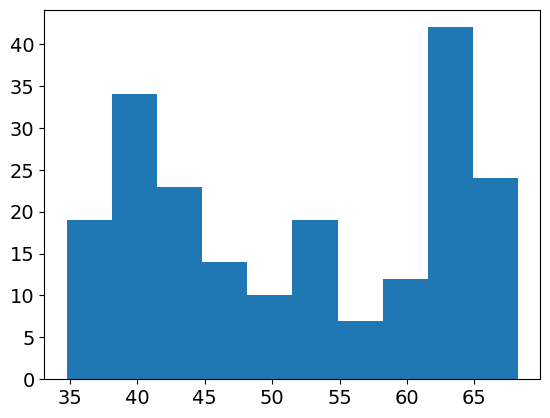

In [10]:
plt.hist(np.array(detsum)/1e6)

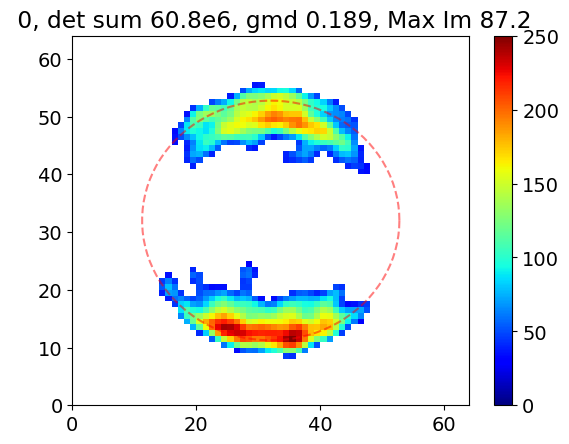

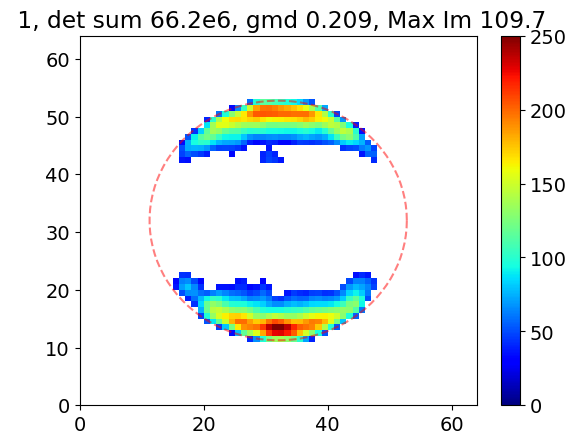

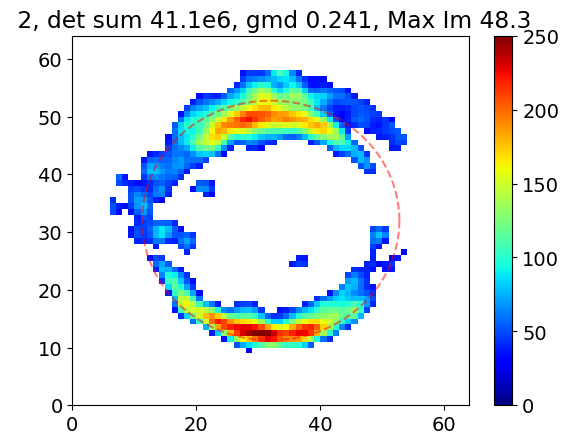

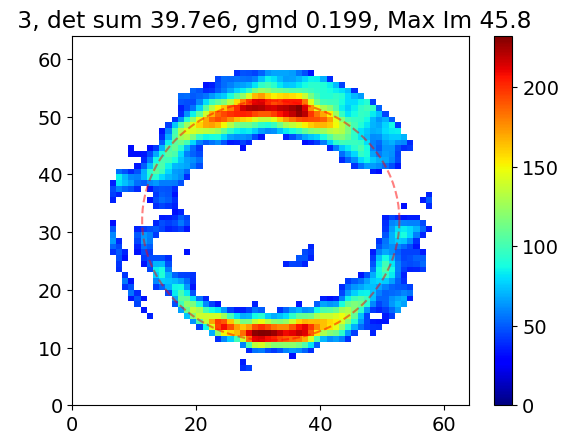

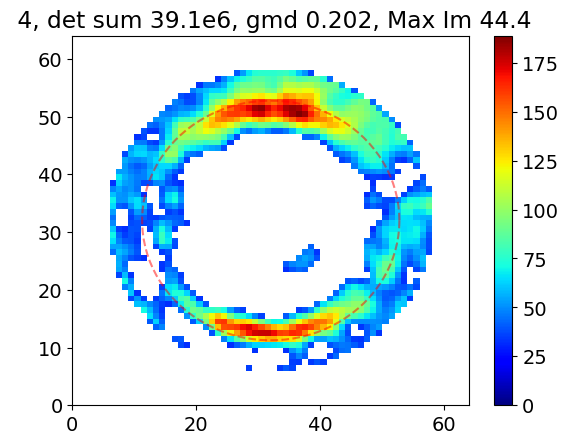

...

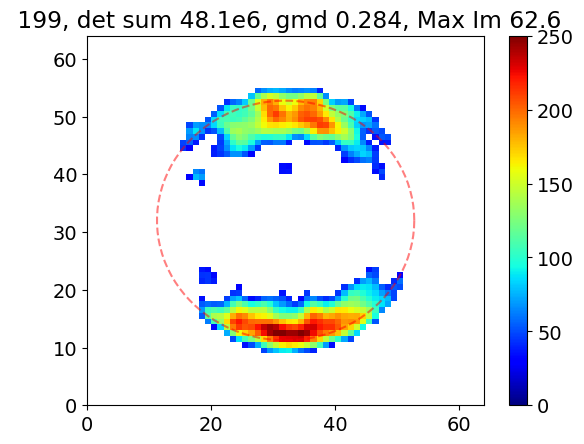

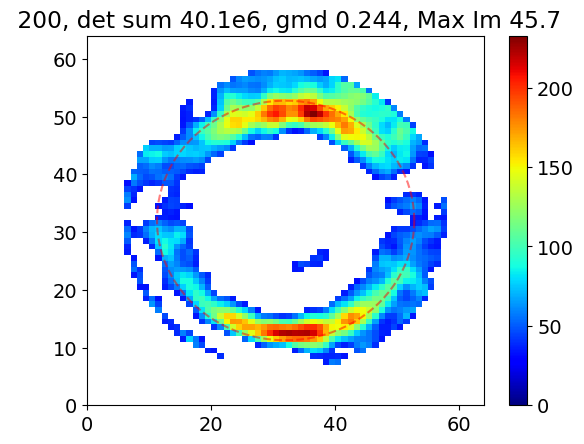

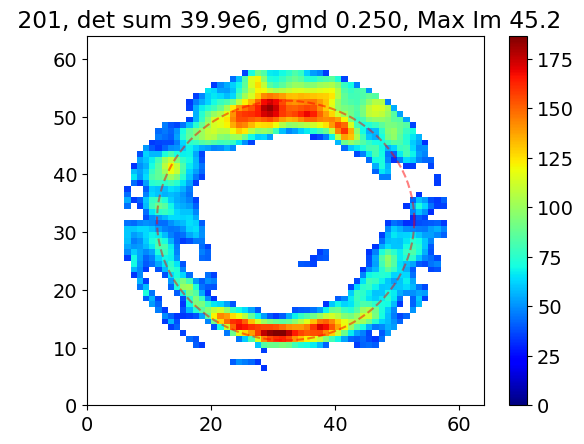

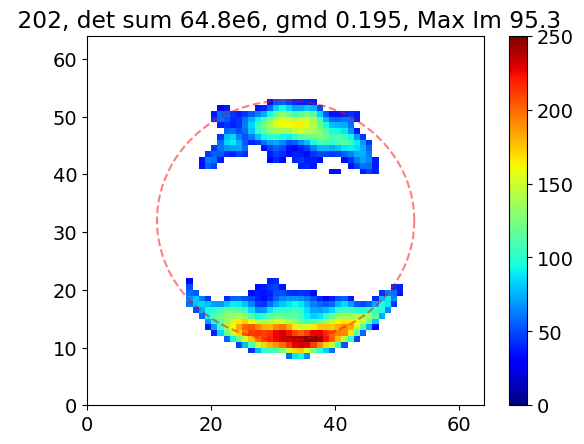

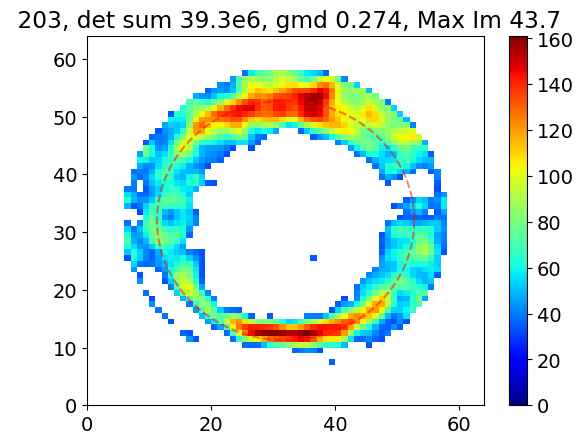

In [11]:
phi_rad = np.linspace(0,360,100)*np.pi/180

for i in range(len(specs)):
    c = cVMIs[i]
    c[c<0] = 0
    cVMIs[i] = c
    plt.pcolormesh(c, cmap = my_cmap)
    plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.colorbar()
    plt.title(' %1.0f, det sum %1.1fe6, gmd %1.3f, Max Im %1.1f' %(i,detsum[i]/1e6, gds[i], maxim[i]))
    plt.show()
    # fig,axs = plt.subplots(nrows = 1, ncols = 3, figsize = (15,4))
    # scc = 1 #np.max(cVMIsa[i]/np.sum(cVMIsa[i]))
    # p = axs[0].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[0])
    # p = axs[1].pcolormesh(cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[1])
    # p = axs[2].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc-cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[2])
    # plt.show()

In [13]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jul27_112.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jul27_112.npy', cVMIs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/GDs_Jul27_112.npy', gds)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/tmpstmps_Jul27_112.npy', tmstmps)


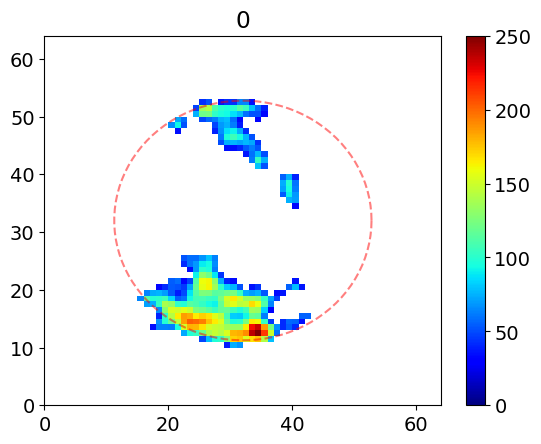

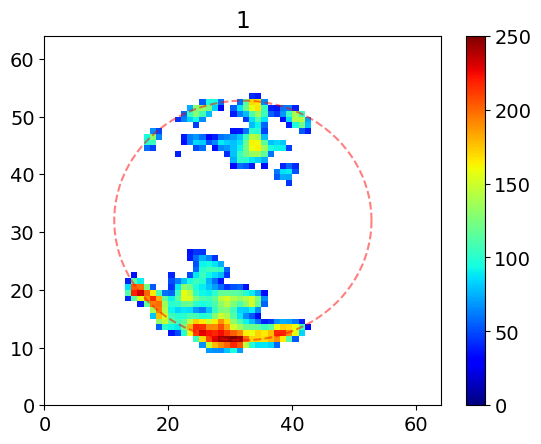

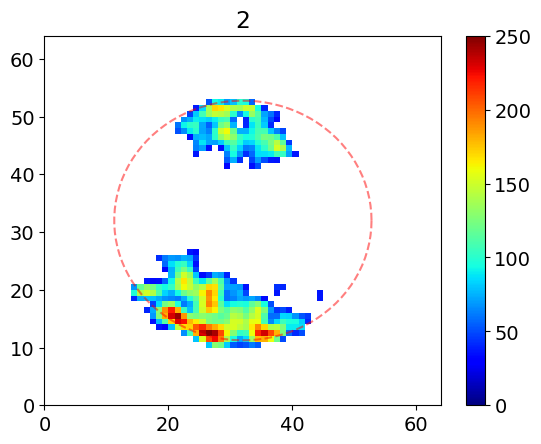

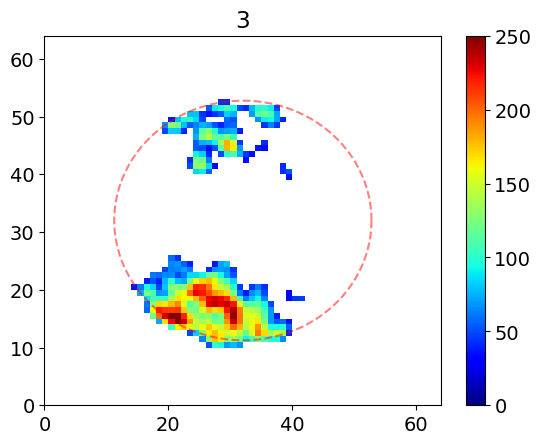

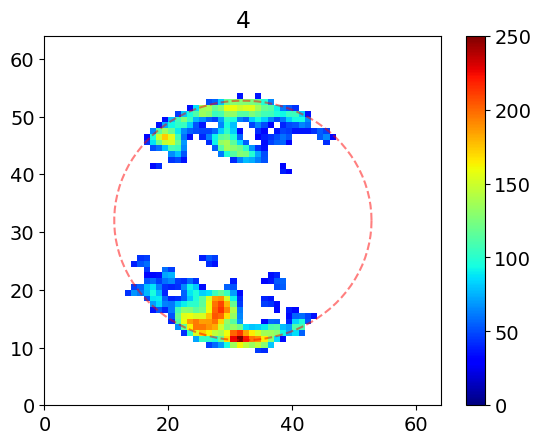

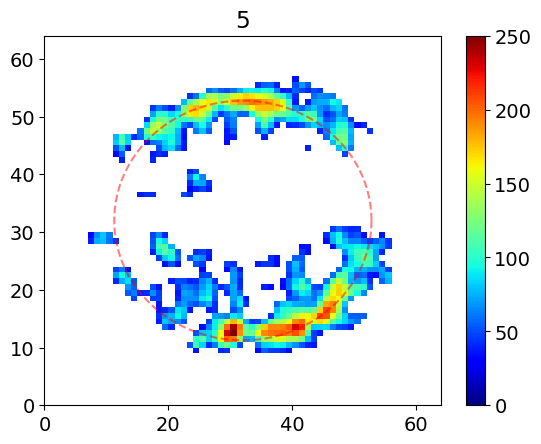

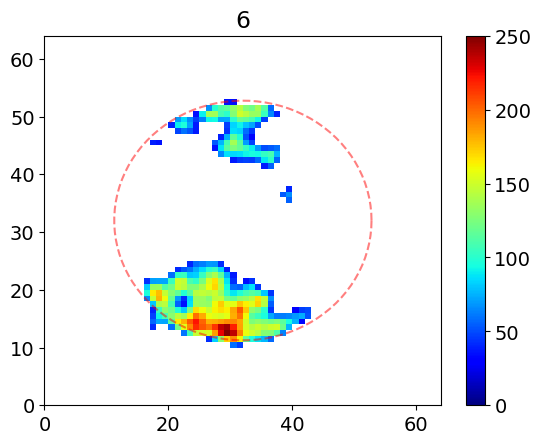

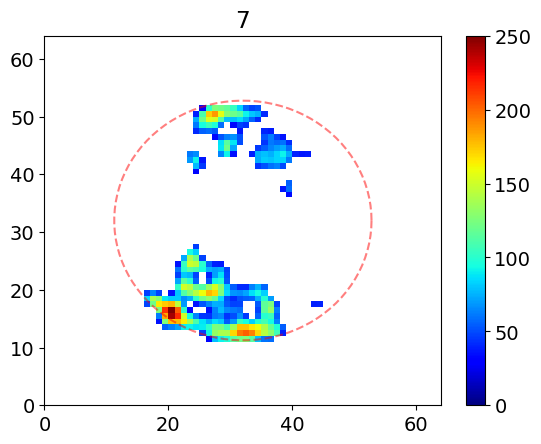

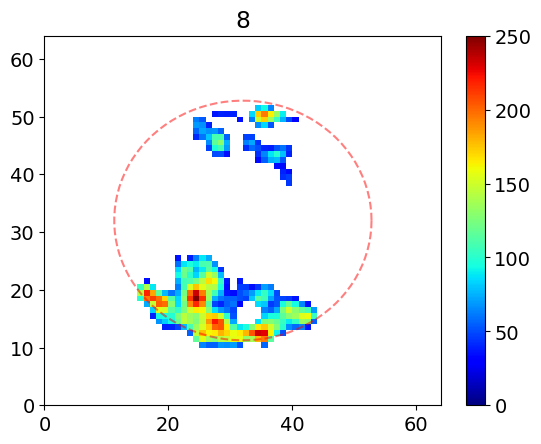

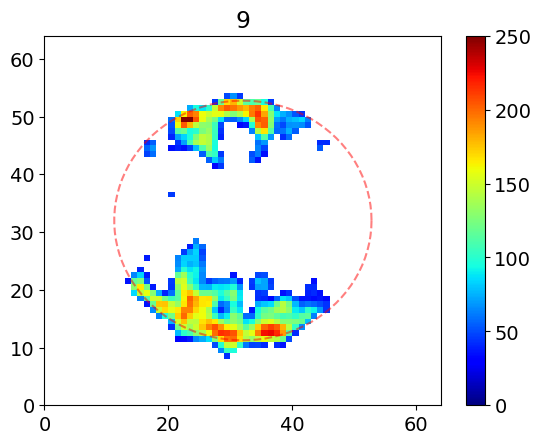

In [11]:
cVMIs2 = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Mar25_127.npy', allow_pickle = True)[()]
phi_rad = np.linspace(0,360,100)*np.pi/180

for i in range(10):
    c = cVMIs2[i]
    c[c<0] = 0
    plt.pcolormesh(c, cmap = my_cmap)
    plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.colorbar()
    plt.title(i)
    plt.show()

Text(0.5, 1.0, '5')

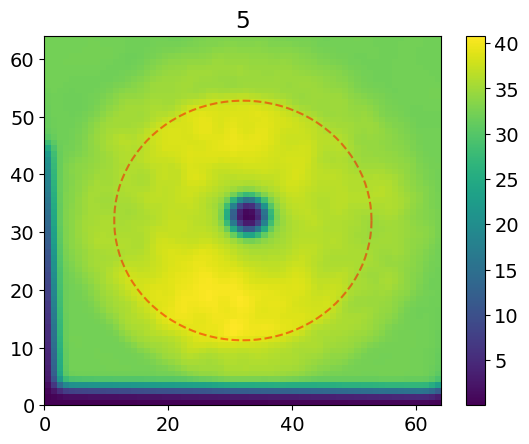

In [34]:
i = 5
plt.pcolormesh(unproc[i])
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title(i)

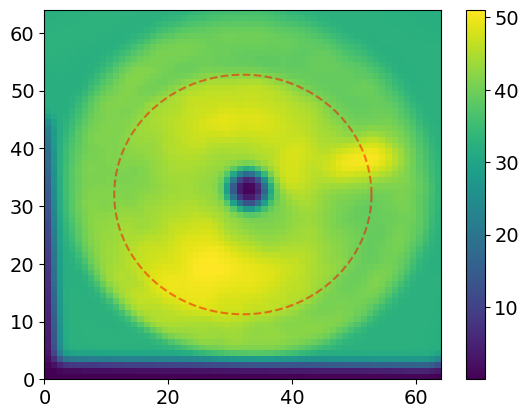

In [28]:
plt.pcolormesh(resid)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)

plt.colorbar()

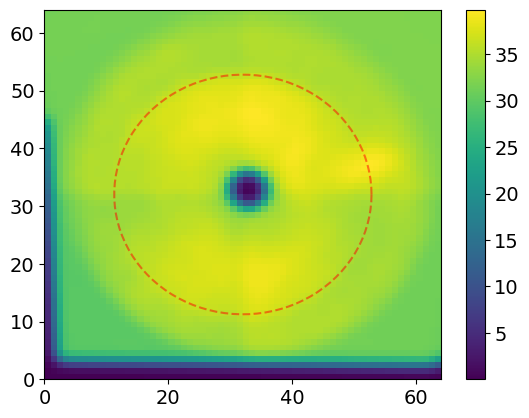

In [29]:
resid2= np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_127_Mar.npy')
plt.pcolormesh(resid2)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)

plt.colorbar()

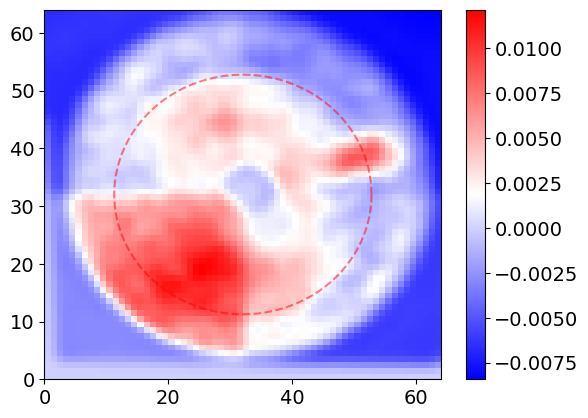

In [33]:
plt.pcolormesh((resid/np.sum(resid)-resid2/np.sum(resid2))*250, cmap = 'bwr')
plt.colorbar()
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)


In [15]:
len(cVMIs2)

115

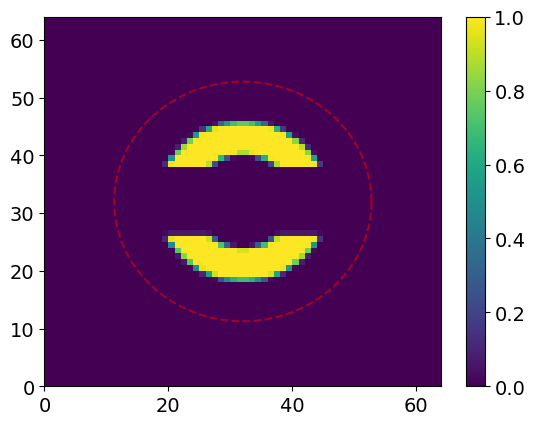

In [42]:
# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>100) & (rs<220)] = 1

testmask = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
testmask [(rs>130) & (rs<220)]=1
testmask [(Y>26*16) & (Y<38*16)]=0

# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>140) & (rs<220) & (X>28*16) &(X<36*16)]=1

# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# #testmask[(Y>26*16) & (Y<38*16) & (rs>80)]=1
# testmask[(Y>28*16) & (Y<36*16) & (rs>80)]=1
# testmask [(rs>390) & (rs<430)]=1


# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>390) & (rs<430)]=1

plt.pcolormesh(rebin(rebin(testmask,4),4))
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()


In [43]:
ims2 = np.copy(ims)
ims2 = mf(ims2, mfn)
ims2 = gf(ims2, gfn)
ims2= rebin(rebin(ims2,4),4)
unproc = ims2

#resid_scale = resid/np.mean(resid[24:36,22:27])*np.mean(ims2[24:36,22:27])
resid_scale = resid/np.mean(resid*rebin(rebin(testmask,4),4))*np.mean(ims2*rebin(rebin(testmask,4),4))
#residold_scale = residold/np.mean(residold*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
#ims2old = ims2 - residold_scale
ims2 = ims2 - resid_scale
ims2 = gf(ims2,.25)
#ims2old = gf(ims2old,.25)
#ims2 = rebin(ims2) #*inbg
ims2 = ims2*250/np.max(ims2)#*rebin(rebin(maskhm,4),4)



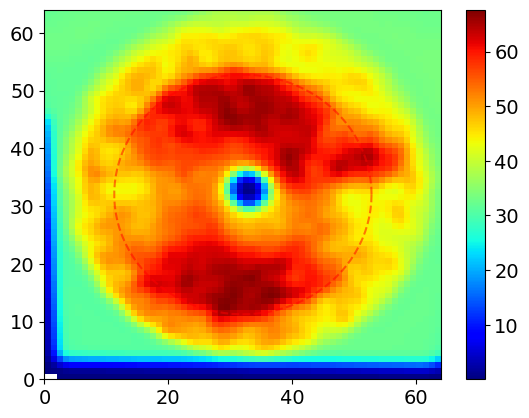

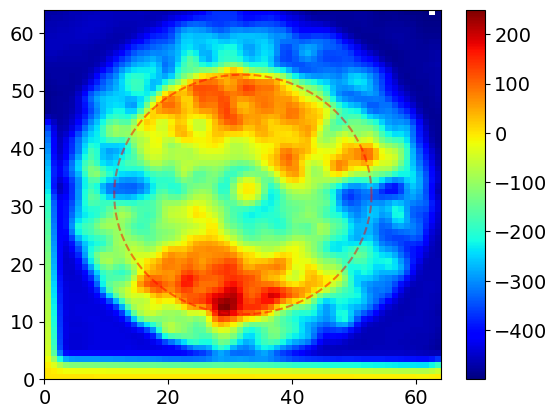

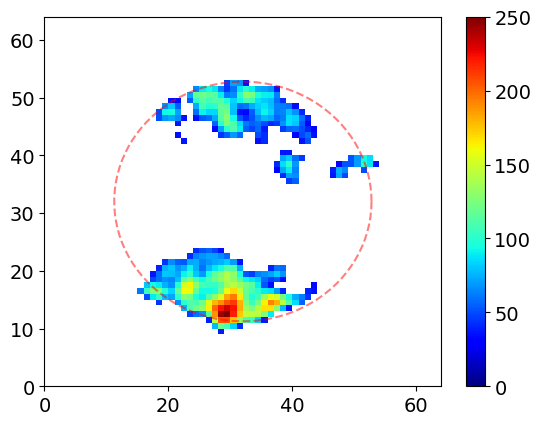

In [44]:
plt.pcolormesh(unproc, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()
plt.pcolormesh(ims2, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()
ims2[ims2<thresh] = 0
plt.pcolormesh(ims2*rebin(rebin(maskhm,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()

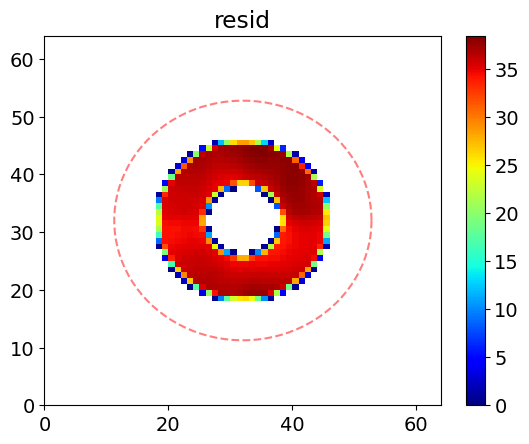

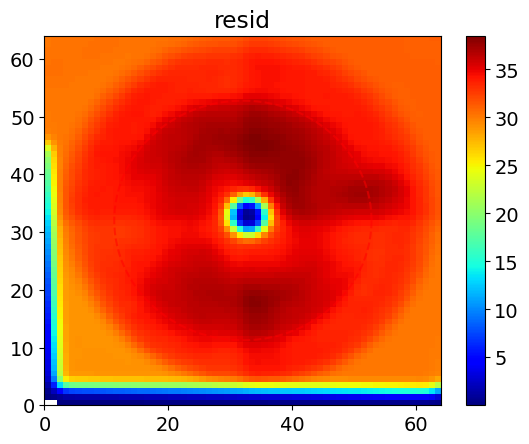

In [57]:
plt.pcolormesh(resid*rebin(rebin(testmask,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title('resid')
plt.show()


plt.pcolormesh(resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title('resid')
plt.show()

In [250]:
maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale [(rs>100) & (rs<220)]=1
#maskscale [(rs>120) & (rs<250)]=1



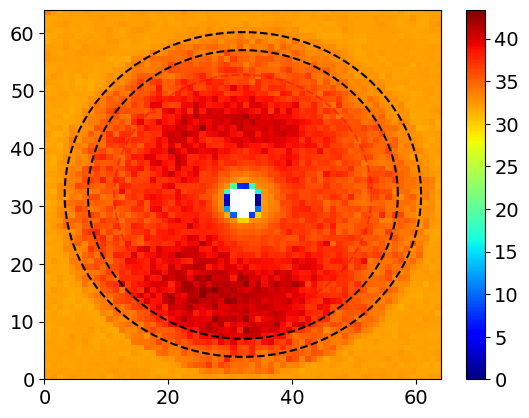

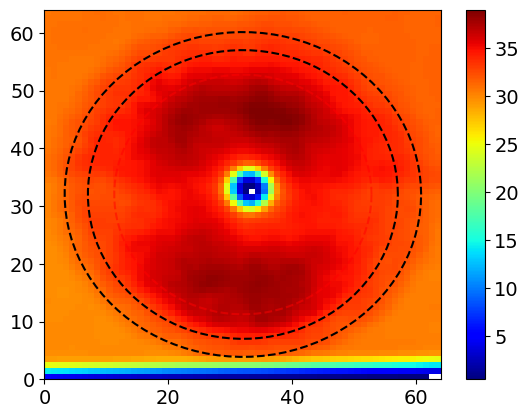

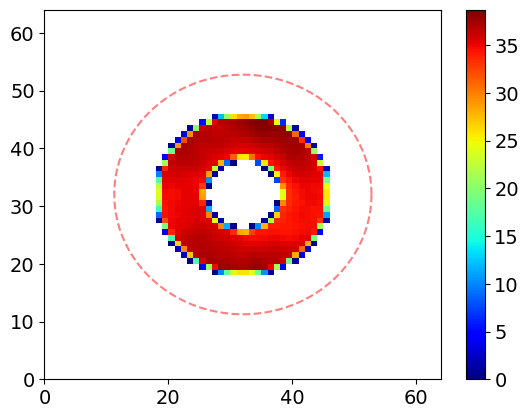

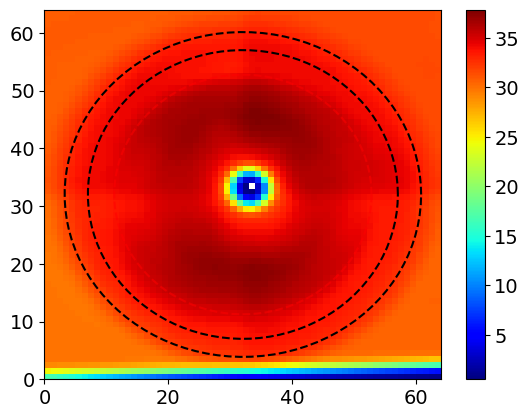

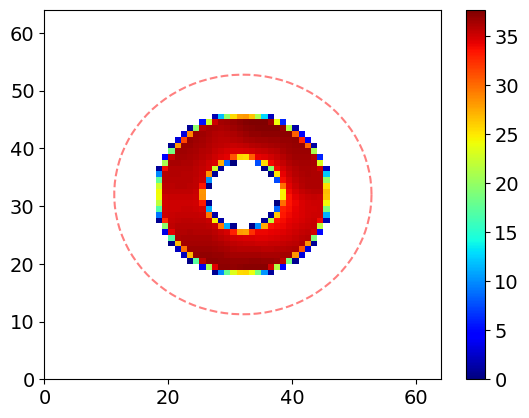

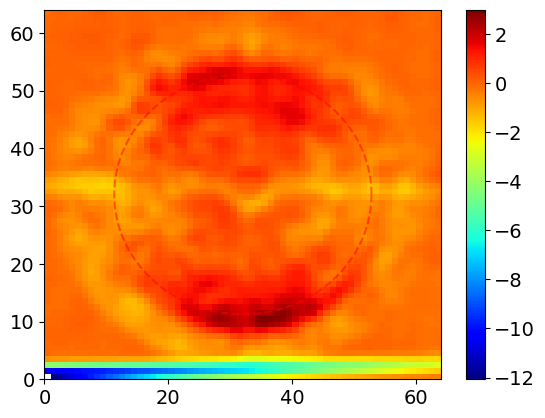

In [251]:
ims = np.rot90(im1*mask)
plt.pcolormesh(rebin(rebin(ims,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

gasoff = 0 #gasoff0/np.mean(gasoff0)*np.mean(ims)
ims = cv2.warpPerspective(ims-gasoff,MM,(1024,1024))*quads
ims[ims<0] = 0
ims2 = np.copy(ims)
ims2 = mf(ims2, mfn)
ims2 = gf(ims2, gfn)
ims2= rebin(rebin(ims2,4),4)
plt.pcolormesh(ims2, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

plt.pcolormesh(ims2*rebin(rebin(maskscale,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()

plt.pcolormesh(resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

plt.pcolormesh(resid*rebin(rebin(maskscale,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()



plt.pcolormesh(ims2 - resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()


In [248]:
# maskscale3 = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# maskscale3[(rs>400) & (rs<450)]=1



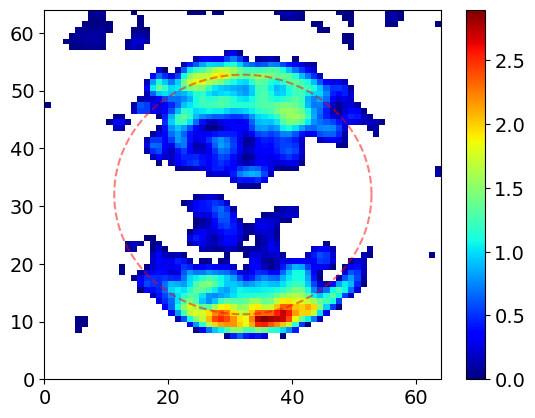

In [252]:
resid_scale = resid/np.mean(resid*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
ims2 = ims2 - resid_scale
ims2 = gf(ims2,.25)
ims2[ims2<0] = 0
phi_rad = np.linspace(0,360,100)*np.pi/180
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.pcolormesh(ims2, cmap = my_cmap)
plt.colorbar()
plt.show()

In [51]:
len(specs)

42

In [52]:
len(cVMIs)

42

In [53]:
len(tt)

42

(array([7., 4., 5., 7., 4., 3., 5., 4., 2., 1.]),
 array([0.15234375, 0.16209717, 0.17185059, 0.181604  , 0.19135742,
        0.20111084, 0.21086426, 0.22061768, 0.23037109, 0.24012451,
        0.24987793]),
 <BarContainer object of 10 artists>)

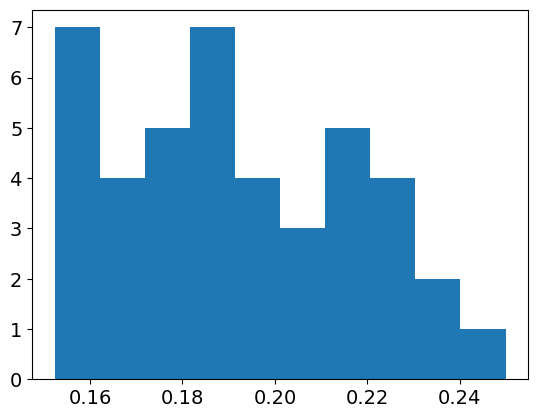

In [15]:
plt.hist(gds)

In [16]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/GDs_Jan19_110_2.npy', gds)

In [60]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan19_110_2.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan19_110_2.npy', cVMIs)

In [63]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan16_110.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan16_110.npy', cVMIs)

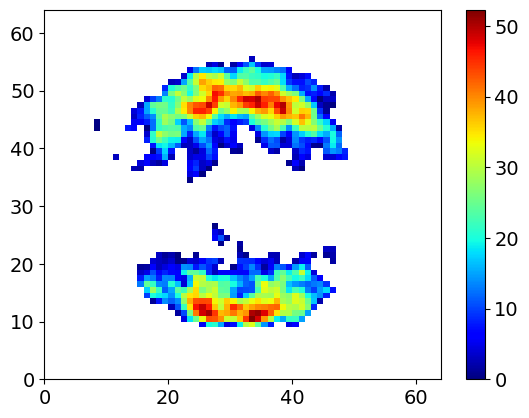

In [69]:
plt.pcolormesh(cVMIs[-10], cmap = my_cmap)
plt.colorbar()

In [9]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan11.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan11.npy', cVMIs)

In [48]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Dec16.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Dec16.npy', cVMIs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_nobg_Dec16.npy', unproc)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/ts_Dec16.npy', tt)

In [32]:
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_Nov5.npy', specs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_Nov5.npy', cVMIs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_oldresid_Nov5.npy', cVMIsold)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/ts_Nov5.npy', tt)

In [13]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_nobg_Nov5.npy', unproc)

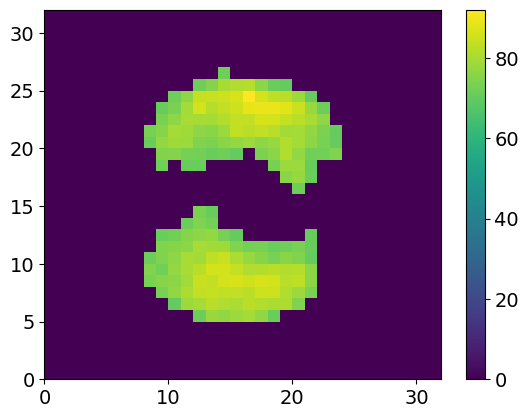

In [30]:
aa = rebin(unproc[0])
aa[ aa<70] = 0
plt.pcolormesh(aa)
plt.colorbar()

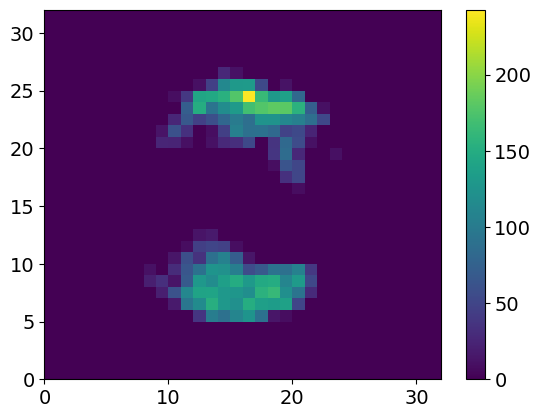

In [28]:
bb = rebin(cVMIs[0])
bb[bb<0] = 0
plt.pcolormesh(bb)
plt.colorbar()

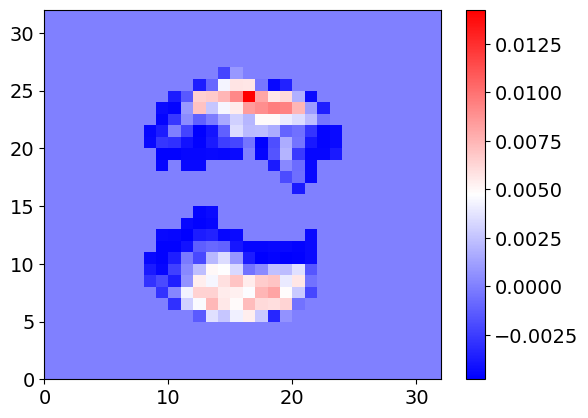

In [33]:
plt.pcolormesh(bb/np.sum(bb) - aa/np.sum(aa), cmap = 'bwr')
plt.colorbar()


/tmp/ipykernel_15835/1804110446.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs = plt.subplots(nrows = 1, ncols = 5, figsize = (16,3))


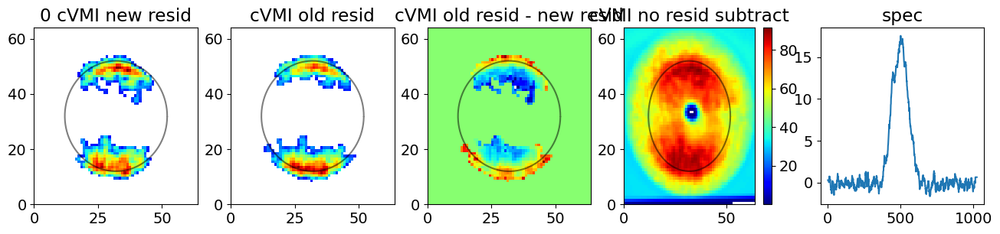

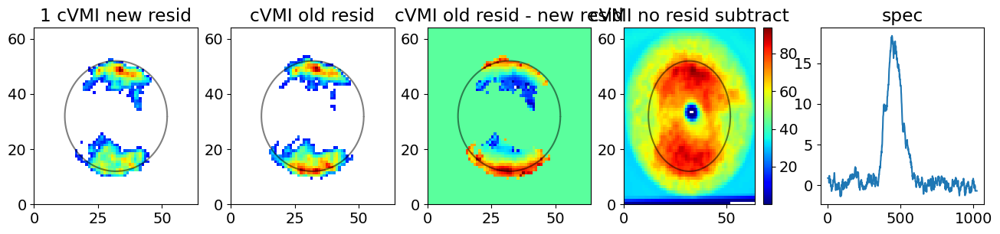

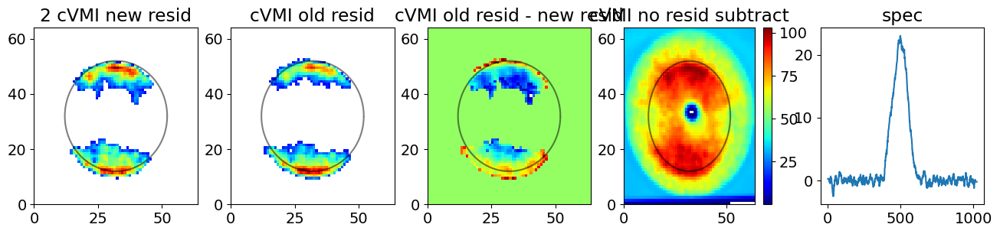

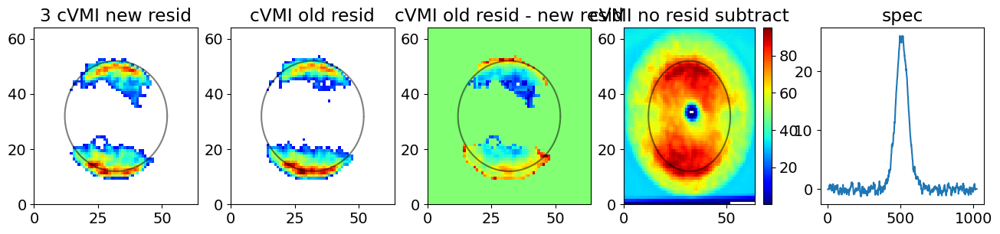

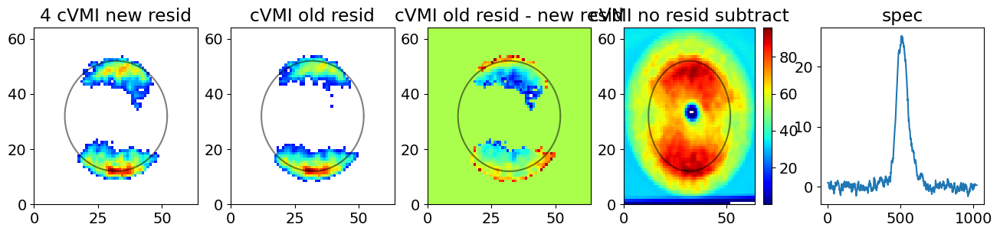

...

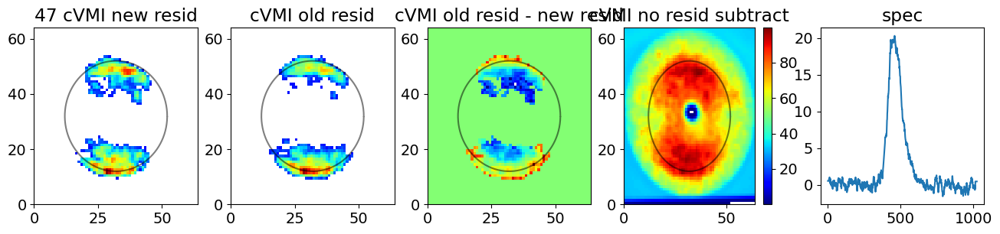

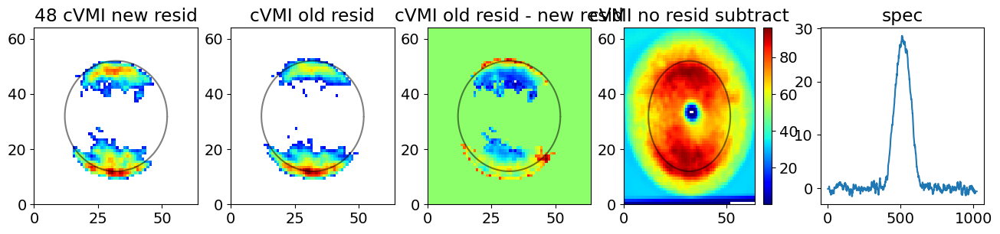

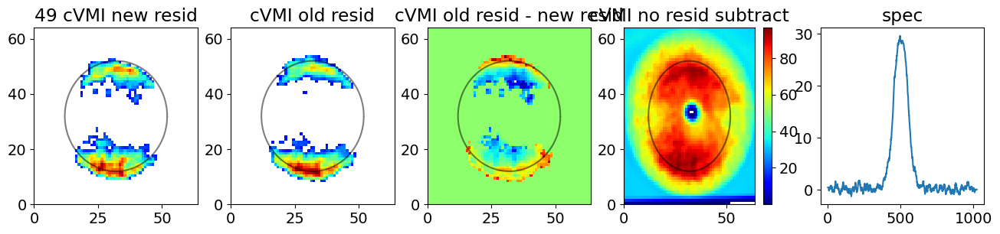

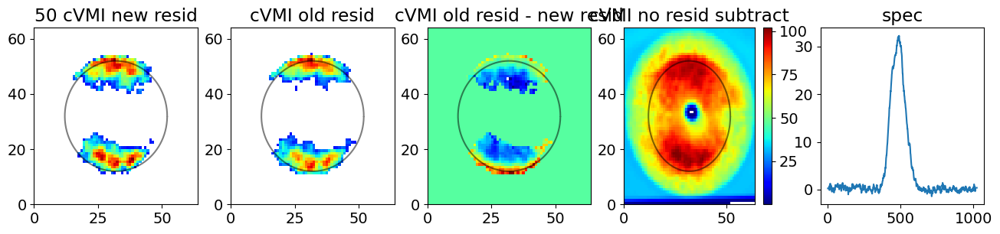

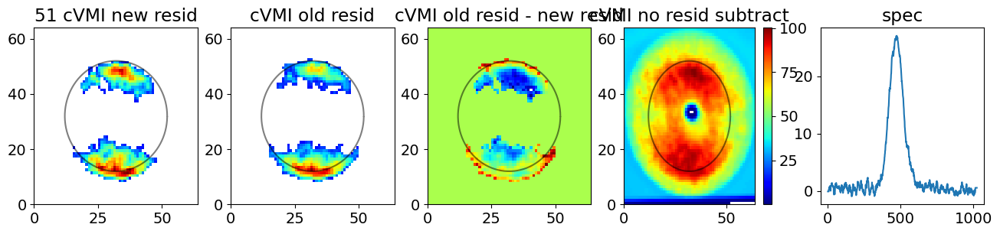

In [49]:
for i in range(len(tt)):
    fig,axs = plt.subplots(nrows = 1, ncols = 5, figsize = (16,3))
    axs[0].pcolormesh(cVMIs[i], cmap = my_cmap)
    axs[1].pcolormesh(cVMIsold[i], cmap = my_cmap)
    axs[2].pcolormesh(cVMIsold[i]-cVMIs[i], cmap = my_cmap)
    p =axs[3].pcolormesh(unproc[i], cmap = my_cmap)
    phis = np.linspace(0,359,100)*np.pi/180
    axs[0].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[1].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[2].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[3].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[4].plot(specs[i])
    axs[0].set_title('%1.0f cVMI new resid' %i)
    axs[1].set_title('cVMI old resid')
    axs[2].set_title('cVMI old resid - new resid')
    axs[3].set_title('cVMI no resid subtract')
    axs[4].set_title('spec')
    plt.colorbar(p, ax = axs[3])

In [9]:
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', specs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_testOct28.npy', cVMIs)


In [48]:
b = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()]

In [49]:
len(b)

17

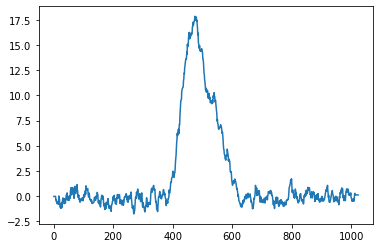

In [52]:
plt.plot(b[12])

In [97]:
tt[10]

4410467694582375735

In [105]:
tt = [4410467754356193385,4410467118580787210,4410467689813058340,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
      4410467689813058340, 4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012] #[4410466500172553581]#[4410466517201035991] #[4410466517376017174] #[4410466521487221820] #[4410466500172553581] #[4410467694582375735] #[4410467436627939444]
tt= np.array(tt)
tt= tt[np.argsort(tt)]
tt[16]

4410467724635877132

In [106]:
ttnew = [4410467754356193385,4410467118580787210,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
      4410467689813058340, 4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012,
      4410466482935666616, 4410466573846689349, 4410466594694478956, 4410466654584819656, 4410466684855376363, 4410466684972030485,4410466732255078812, 4410466753627943040, 4410466771014121067,
      4410466861457740912, 4410466865519007108, 4410466869746996948, 4410466925753018715, 4410466930289290010, 4410466981025037018]

ttnew= np.array(ttnew)
ttnew= ttnew[np.argsort(ttnew)]
np.where(np.array(ttnew) == 4410467724635877132)

(array([30]),)

In [99]:
ttnew[9]

4410467694582375735

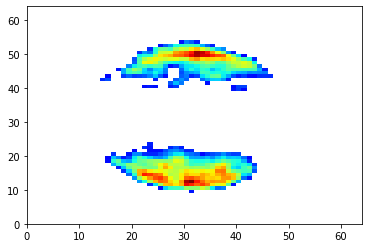

In [42]:
plt.pcolormesh(b, cmap = my_cmap)

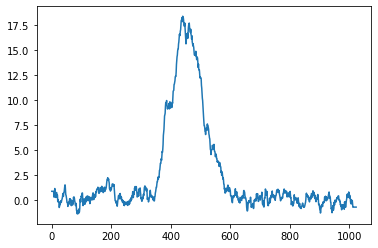

In [62]:
c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_Oct31.npy', allow_pickle = True)[()][0]
plt.plot(c)

In [24]:
np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_test.npy', allow_pickle = True)[()].shape

(17, 1024)

In [65]:
from scipy.interpolate import interp1d

In [70]:
Bps = []
alphas = []
vNaxiss = []

Np = 128
N_w=6
N_t=6 
energy_x = 54 #eV
hbar=6.6e-16 #eV*s
Nb=N_t*N_w
basesdir = '/reg/d/psdm/tmo/tmox51020/results/paris/circularpol_vNbases_dipole_K5/'

Up = 0.7  
filename = 'Bpbasis_Np' + str(Np) + '_Nw' + str(N_w) +'_Nt' + str(N_t) + '_Up' + str(Up)+'.npy'
br = np.load(basesdir+filename, allow_pickle=True)
Breal = br[()]['Breal']
Bimag = br[()]['Bimag']
breal = br[()]['breal']
bimag = br[()]['bimag']
vNaxis = br[()]['vNaxis']
alpha = br[()]['alpha']
Bp_basis = Breal+1j*Bimag

In [71]:
N = 2801
xf = np.arange(-N/2,N/2,1)/((vNaxis['t_sample'][-1] - vNaxis['t_sample'][0])) #using tsample range
eV = 1239.84*(2*np.pi*xf)/2.9979E8/(2*np.pi)*1e-9 

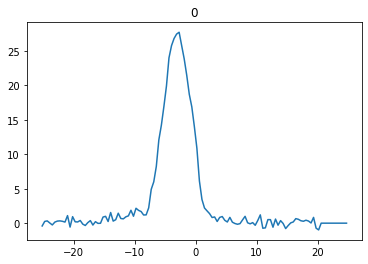

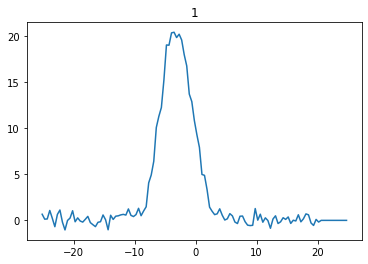

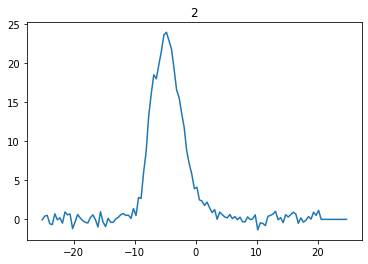

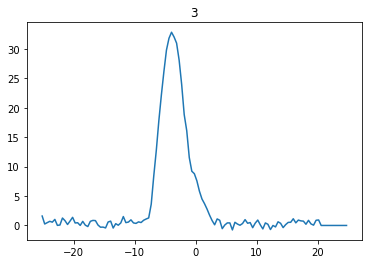

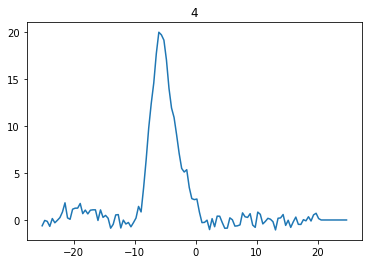

...

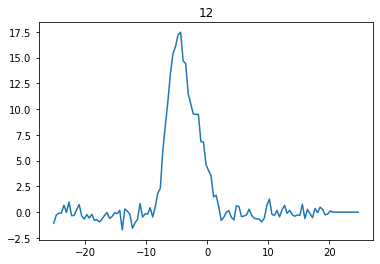

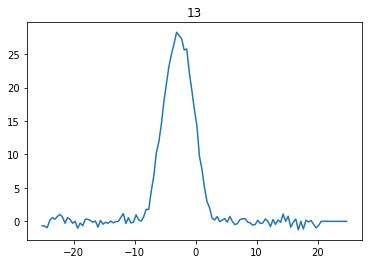

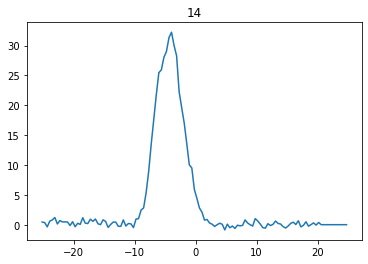

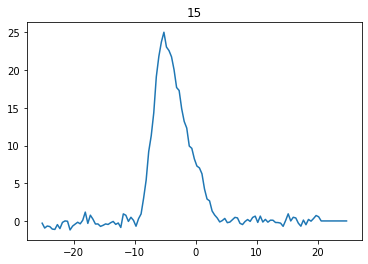

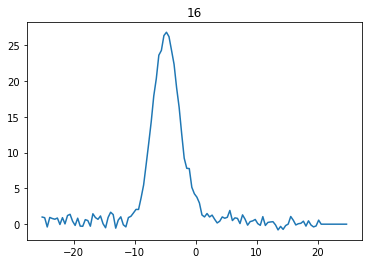

In [93]:
for i in range(17):
    fig,axs = plt.subplots()
    c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()][i]
    eshift = 2.9
    xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
    xeV = xeV - eshift #2.5 #3 #know this from previous calibration
    f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
    spec_in = f(eV[1340:-1340])
    #plt.plot(eV[1340:-1340], spec_in, ':')
    plt.plot(eV[1340:-1340], spec_in)
    plt.title(i)
    

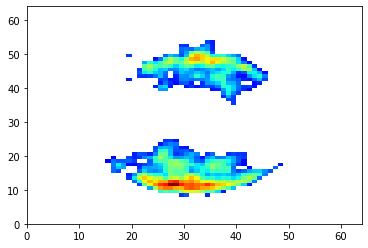

In [94]:
m = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_testOct28.npy', allow_pickle = True)[()][10]
plt.pcolormesh(m, cmap = my_cmap)
   

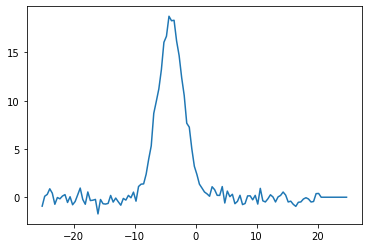

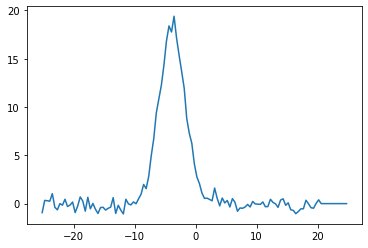

In [96]:
c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()][10]
eshift = 2.9
xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
xeV = xeV - eshift #2.5 #3 #know this from previous calibration
f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
spec_in = f(eV[1340:-1340])
plt.plot(eV[1340:-1340], spec_in)
eshift = 2.7
xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
xeV = xeV - eshift #2.5 #3 #know this from previous calibration
f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
spec_in = f(eV[1340:-1340])
#plt.plot(eV[1340:-1340], spec_in, ':')
fig,axs = plt.subplots()
plt.plot(eV[1340:-1340], spec_in)

In [6]:
! cp torchrecon_funcs.py /reg/d/psdm/tmo/tmox51020/results/paris/recon

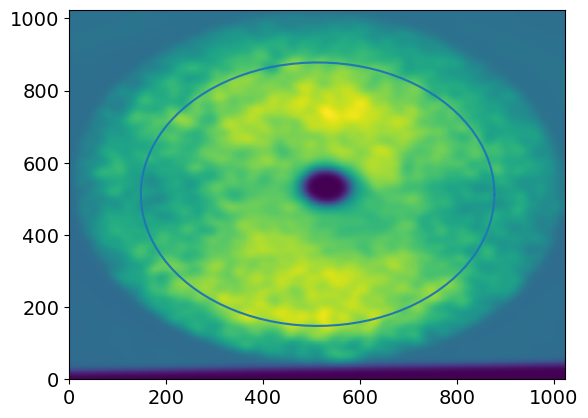

In [45]:
plt.pcolormesh(iiii)
phis = np.linspace(0,360,100)*np.pi/180
plt.plot(512+5.6*np.cos(347)+365*np.cos(phis), 512+5.6*np.cos(347)+365*np.sin(phis),)

In [42]:
R_vs_phi_1st, phi_1st = center_optimization_1st_polar(iiii, [512,512])
fit = lstSqFit(circpol, phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True) # phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True)

In [43]:
fit

(array([  5.60305325, 365.42739272, 347.05100458]), 19114.872376537853)

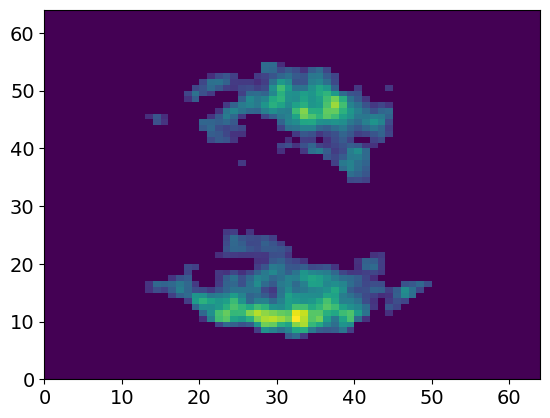

In [13]:
mdat = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Dec16.npy')
plt.pcolormesh(mdat[16])

In [24]:
R_vs_phi_1st, phi_1st = center_optimization_1st_polar(gf(cv2.resize(mdat[16], (1024,1024), interpolation = cv2.INTER_AREA),7), [512,512])
fit = lstSqFit(circpol, phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True) # phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True)

In [25]:
fit

(array([ 17.53019695, 336.63918593, 228.24245851]), 35502.88634779221)

In [27]:
17.5/16

1.09375

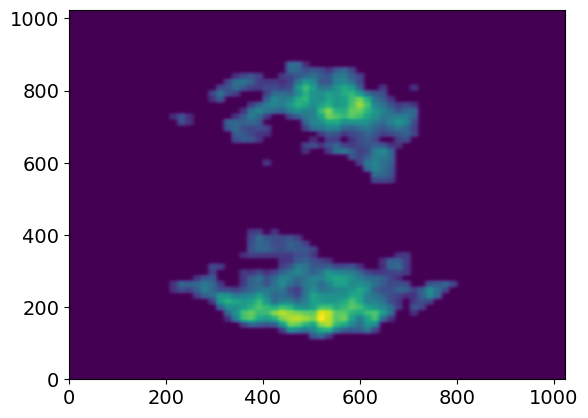

In [29]:
plt.pcolormesh(gf(cv2.resize(mdat[16], (1024,1024), interpolation = cv2.INTER_AREA),4))